In [1]:
from google.cloud import bigquery as bq

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from cyvcf2 import VCF
import vcf
import os
import sys
from pyblast import BioBlast
from pyblast.utils import make_linear, make_circular
from Bio.SeqRecord import SeqRecord
from Bio.Seq import Seq
import subprocess

In [4]:
pip install git+https://github.com/saketkc/pysradb


  Cloning https://github.com/saketkc/pysradb to /private/var/folders/3f/h5js1j2521x83002pd39hhgc0000gn/T/pip-req-build-h21klrjh
  Running command git clone -q https://github.com/saketkc/pysradb /private/var/folders/3f/h5js1j2521x83002pd39hhgc0000gn/T/pip-req-build-h21klrjh
  Created wheel for pysradb: filename=pysradb-1.4.2-cp37-none-any.whl size=172508 sha256=9234a7efdd2c07ceae0a3902a0b3c73b746931d1889671528a0eaa070150a26f
  Stored in directory: /private/var/folders/3f/h5js1j2521x83002pd39hhgc0000gn/T/pip-ephem-wheel-cache-7mh3mj5y/wheels/f1/4f/ae/d1dfa9578767bcdbf0e89ea7c07ed2f10fc221761e0a155fc7
Successfully built pysradb
Note: you may need to restart the kernel to use updated packages.


In [5]:
from pysradb.sraweb import SRAweb

/opt/anaconda3/lib/python3.7/site-packages/pysradb/utils.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [6]:

db = SRAweb()

In [7]:

!pysradb --version

pysradb 1.4.2


## 1000 genomes - Extracting human sub populations

In [32]:
vcf_reader2 = vcf.Reader(open('human/human_filtered.vcf', 'r'))

In [33]:
a =[]
for record in vcf_reader2:
    a.append(record)

In [34]:
a[0].INFO['SNAME']

['NA19712:297', 'HG04183:335', 'HG02348:286', 'NA20524:291', 'HG04156:382']

In [72]:
variants_human_list_of_lists = [None]*len(a)
# sample_names_for_horse_records = [None]*len(horse_records)

for index in range(len(a)):
    variants_human_list_of_lists[index] = a[index].INFO['SNAME']
    

In [51]:
variants_human = []

for i in a:
    for j in i.INFO['SNAME']:
        entry = j[:j.index(":")]
        variants_human.append(entry)

In [52]:
len(variants_human)

354301

In [53]:
list_of_unique_variants = []

unique_variants = set(variants_human)

for var in unique_variants:
    list_of_unique_variants.append(var)

In [54]:
list_of_unique_variants

['NA19083',
 'HG00188',
 'HG03914',
 'NA19019',
 'HG02736',
 'HG02010',
 'NA21117',
 'HG04177',
 'NA18992',
 'HG03894',
 'NA19722',
 'HG00614',
 'HG02870',
 'HG00421',
 'NA20524',
 'HG02035',
 'HG02272',
 'HG01704',
 'NA19661',
 'HG01250',
 'NA20356',
 'HG04060',
 'NA18997',
 'HG00472',
 'NA12778',
 'HG02721',
 'HG02348',
 'HG03615',
 'NA12348',
 'HG01700',
 'NA19909',
 'NA19651',
 'HG04156',
 'HG02075',
 'HG00524',
 'NA19678',
 'HG00176',
 'HG01168',
 'HG02040',
 'HG02122',
 'HG03644',
 'HG03824',
 'HG02332',
 'HG04183',
 'NA12761',
 'HG01435',
 'NA19711',
 'NA11920',
 'NA12889',
 'HG00449',
 'NA20126',
 'HG00183',
 'HG02724',
 'HG03803',
 'NA19712',
 'HG00234',
 'NA19701',
 'NA19009',
 'NA12006',
 'HG02121',
 'NA12399',
 'HG01991',
 'HG01686',
 'NA20819',
 'NA19451',
 'HG02691',
 'NA18946',
 'NA19921',
 'HG01080',
 'NA19725',
 'NA18999',
 'HG01848',
 'HG03874',
 'NA19679',
 'HG00171',
 'HG00157',
 'HG01942',
 'HG00253',
 'HG01055',
 'HG00239',
 'NA19700',
 'NA18957',
 'HG03120',
 'NA

In [44]:
genomes1000df = pd.read_csv('igsr_samples.tsv', sep='\t')


In [62]:
genomes1000df

,Sample name,Sex,Biosample ID,Population code,Population name,Superpopulation code,Superpopulation name,Population elastic ID,Data collections
0,HG00271,male,SAME123417,FIN,Finnish,EUR,European Ancestry,FIN,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC..."
1,HG00276,female,SAME123424,FIN,Finnish,EUR,European Ancestry,FIN,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC..."
2,HG00288,female,SAME1839246,FIN,Finnish,EUR,European Ancestry,FIN,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC..."
3,HG00290,male,SAME1839057,FIN,Finnish,EUR,European Ancestry,FIN,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC..."
4,HG00303,male,SAME1840115,FIN,Finnish,EUR,European Ancestry,FIN,1000 Genomes on GRCh38
...,...,...,...,...,...,...,...,...,...
4973,HGDP00773,female,SAMEA3302906,NaN,Japanese,NaN,East Asia (SGDP),JapaneseSGDP,Simons Genome Diversity Project
4974,R3,male,SAMEA3302714,NaN,Relli,NaN,South Asia (SGDP),RelliSGDP,Simons Genome Diversity Project
4975,NA12236,female,SAMEA6604124,CEU,CEPH,EUR,European Ancestry,CEU,1000 Genomes 30x on GRCh38
4976,HGDP00456,male,NaN,NaN,Mbuti,NaN,Africa (HGDP),MbutiHGDP,HGDP Transcriptome


In [63]:
dictionary_of_variants_and_populations = {}
for v in list_of_unique_variants:
    index = genomes1000df.index[genomes1000df['Sample name']==v][0]
    value = genomes1000df.loc[index, 'Superpopulation name']
    dictionary_of_variants_and_populations[v] = value

#     print(genomes1000df.loc[genomes1000df['Sample name'] == 'HG00449'])

In [64]:
dictionary_of_variants_and_populations

{'NA19083': 'East Asian Ancestry',
 'HG00188': 'European Ancestry',
 'HG03914': 'South Asian Ancestry',
 'NA19019': 'African Ancestry',
 'HG02736': 'South Asian Ancestry',
 'HG02010': 'African Ancestry',
 'NA21117': 'South Asian Ancestry',
 'HG04177': 'South Asian Ancestry',
 'NA18992': 'East Asian Ancestry',
 'HG03894': 'South Asian Ancestry',
 'NA19722': 'American Ancestry',
 'HG00614': 'East Asian Ancestry',
 'HG02870': 'African Ancestry',
 'HG00421': 'East Asian Ancestry',
 'NA20524': 'European Ancestry',
 'HG02035': 'East Asian Ancestry',
 'HG02272': 'American Ancestry',
 'HG01704': 'European Ancestry',
 'NA19661': 'American Ancestry',
 'HG01250': 'American Ancestry',
 'NA20356': 'African Ancestry',
 'HG04060': 'South Asian Ancestry',
 'NA18997': 'East Asian Ancestry',
 'HG00472': 'East Asian Ancestry',
 'NA12778': 'European Ancestry',
 'HG02721': 'African Ancestry',
 'HG02348': 'American Ancestry',
 'HG03615': 'South Asian Ancestry',
 'NA12348': 'European Ancestry',
 'HG01700': '

In [67]:
dictionary_of_variants_and_populations.values()

dict_values(['East Asian Ancestry', 'European Ancestry', 'South Asian Ancestry', 'African Ancestry', 'South Asian Ancestry', 'African Ancestry', 'South Asian Ancestry', 'South Asian Ancestry', 'East Asian Ancestry', 'South Asian Ancestry', 'American Ancestry', 'East Asian Ancestry', 'African Ancestry', 'East Asian Ancestry', 'European Ancestry', 'East Asian Ancestry', 'American Ancestry', 'European Ancestry', 'American Ancestry', 'American Ancestry', 'African Ancestry', 'South Asian Ancestry', 'East Asian Ancestry', 'East Asian Ancestry', 'European Ancestry', 'African Ancestry', 'American Ancestry', 'South Asian Ancestry', 'European Ancestry', 'European Ancestry', 'African Ancestry', 'American Ancestry', 'South Asian Ancestry', 'East Asian Ancestry', 'East Asian Ancestry', 'American Ancestry', 'European Ancestry', 'American Ancestry', 'East Asian Ancestry', 'East Asian Ancestry', 'South Asian Ancestry', 'South Asian Ancestry', 'African Ancestry', 'South Asian Ancestry', 'European Ances

In [71]:
unique_populations = set(dictionary_of_variants_and_populations.values())
unique_populations

{'African Ancestry',
 'American Ancestry',
 'East Asian Ancestry',
 'European Ancestry',
 'South Asia (SGDP),South Asian Ancestry',
 'South Asian Ancestry'}

In [75]:
variants_human_list_of_lists

[['NA19712:297', 'HG04183:335', 'HG02348:286', 'NA20524:291', 'HG04156:382'],
 ['HG01848:327'],
 ['NA18999:320'],
 ['NA18992:1'],
 ['HG00421:1', 'HG01848:1', 'NA18999:2', 'HG01250:1'],
 ['NA19000:1',
  'HG00479:1',
  'NA19451:1',
  'NA20524:1',
  'NA12761:1',
  'HG02691:1',
  'HG03604:1',
  'NA06986:1'],
 ['HG00534:1',
  'HG00614:1',
  'HG04183:1',
  'HG04060:1',
  'HG01704:1',
  'HG03914:1',
  'HG02122:1',
  'HG00176:1',
  'HG01055:1',
  'NA12889:1',
  'HG03615:1',
  'NA12348:1',
  'HG01700:1',
  'HG00157:1',
  'HG00378:1',
  'NA12778:1',
  'HG01079:1',
  'NA18992:2',
  'HG02332:1',
  'HG00183:1',
  'NA21117:1',
  'HG01848:2',
  'NA19661:1',
  'HG02272:1',
  'HG00239:1',
  'NA18946:1',
  'HG00449:1',
  'NA19921:1',
  'HG01250:2',
  'HG00234:1',
  'HG02736:1',
  'NA19909:1',
  'HG01435:1',
  'NA19009:1',
  'NA19678:1',
  'NA12006:1',
  'HG00188:1',
  'HG00308:1',
  'HG03803:1',
  'HG02348:1',
  'NA20819:1',
  'NA11920:1',
  'HG02721:1',
  'HG00524:1',
  'HG04156:1',
  'HG01864:1',
  'N

In [78]:
dictionary_of_sub_genus_and_sample_indeces_human= {"African Ancestry" : [], "American Ancestry" : [], "East Asian Ancestry" : [], "European Ancestry": [], "South Asia (SGDP),South Asian Ancestry" : [], "South Asian Ancestry" : []}
array_i = 0
for array in variants_human_list_of_lists:
    for sname in array:
        entry = sname[:sname.index(":")]
        if entry in dictionary_of_variants_and_populations.keys():
            population = dictionary_of_variants_and_populations[entry]
            if array_i not in dictionary_of_sub_genus_and_sample_indeces_human[population]:
                dictionary_of_sub_genus_and_sample_indeces_human[population].append(array_i)
    array_i = array_i + 1    

In [79]:
dictionary_of_sub_genus_and_sample_indeces_human

{'African Ancestry': [0,
  5,
  6,
  7,
  10,
  11,
  12,
  13,
  16,
  18,
  19,
  21,
  22,
  23,
  27,
  28,
  30,
  33,
  37,
  38,
  42,
  43,
  45,
  46,
  48,
  50,
  51,
  53,
  54,
  55,
  56,
  57,
  58,
  60,
  61,
  64,
  65,
  66,
  67,
  69,
  71,
  79,
  80,
  85,
  86,
  89,
  90,
  92,
  96,
  98,
  103,
  106,
  108,
  110,
  113,
  116,
  119,
  120,
  121,
  122,
  126,
  128,
  129,
  130,
  134,
  139,
  140,
  141,
  143,
  144,
  145,
  146,
  147,
  151,
  152,
  153,
  155,
  156,
  158,
  159,
  160,
  163,
  164,
  165,
  166,
  167,
  170,
  173,
  175,
  176,
  177,
  178,
  181,
  183,
  184,
  187,
  189,
  191,
  192,
  193,
  195,
  197,
  199,
  200,
  201,
  205,
  206,
  207,
  208,
  209,
  213,
  215,
  216,
  218,
  220,
  221,
  222,
  224,
  226,
  227,
  232,
  235,
  239,
  240,
  242,
  244,
  245,
  247,
  249,
  251,
  255,
  256,
  257,
  258,
  259,
  260,
  264,
  265,
  266,
  268,
  271,
  272,
  273,
  276,
  278,
  279,
  281,
  283

In [83]:
for key in dictionary_of_sub_genus_and_sample_indeces_human:
    sequences_to_write = {}
    counter = 0
    for index in dictionary_of_sub_genus_and_sample_indeces_human[key]:
        
        record = a[index]
        length = record.INFO["END"]-record.POS
        if(length >= 250 and length <= 350):
            status, output = subprocess.getstatusoutput(f'samtools faidx human/hg38.fa {record.CHROM}:{record.POS}-{record.INFO["END"]}')
            result = output[output.find('\n'):]
            sequences_to_write[f'seq{counter}'] = result
            counter=counter+1
    print(len(sequences_to_write))
                                                       
                                                    
    filename = f'human/human_population_file_{key}.fsa'
    write_fasta(sequences_to_write, filename)
            

2318
Success! File written
2070
Success! File written
1929
Success! File written
2018
Success! File written
1044
Success! File written
1947
Success! File written


## Comparing variants by sub genus - Pig 

In [51]:
vcf_reader2 = vcf.Reader(open("pig/pig_filtered.vcf", 'r')) #ex. horse/horse_filtered.vcf
all_records_pig =[]
for record in vcf_reader2:
    all_records_pig.append(record)

sample_names_for_records_pig = [None]*len(all_records_pig)

for index in range(len(all_records_pig)):
    sample_names_for_records_pig[index] = all_records_pig[index].INFO['SNAME']

unique = []
for i in sample_names_for_records_pig:
    for j in i:
        entry = j[:j.index(":")]
        if entry not in unique:
            unique.append(entry)
        

In [53]:
unique

['SRR13786979',
 'SRR13786971',
 'SRR13786991',
 'SRR13786948',
 'ERR4336896',
 'ERR875320',
 'SRR13786984',
 'SRR13786958',
 'SRR13786959',
 'SRR13786964',
 'ERR4336903',
 'SRR13786972',
 'SRR13786968',
 'SRR13786943',
 'SRR13786969',
 'SRR13786949',
 'SRR13786970',
 'ERR4336927',
 'ERR875327',
 'SRR13786993',
 'SRR13786965',
 'SRR13786980',
 'SRR13786981',
 'SRR13786945',
 'SRR13786986',
 'SRR13786995',
 'ERR4336881',
 'ERR875316',
 'ERR4336897',
 'SRR13786963',
 'SRR13786974',
 'SRR13786954',
 'SRR13786982',
 'ERR4336912',
 'SRR13786957',
 'SRR13786976',
 'SRR13786953',
 'SRR13786987',
 'SRR13786983',
 'SRR13786967',
 'SRR13786962',
 'SRR13786966',
 'SRR13786978',
 'SRR13786977',
 'SRR13786973',
 'SRR13786975',
 'SRR13786942',
 'ERR875323',
 'SRR13786956',
 'ERR875318',
 'ERR875326',
 'ERR875325',
 'SRR13786946',
 'SRR13786985',
 'SRR13786947',
 'SRR13786941',
 'SRR13786940',
 'SRR13786961',
 'SRR13786989',
 'SRR13786950',
 'SRR13786955',
 'SRR13786952',
 'ERR4336924',
 'SRR13786988

In [54]:
sub_genuses = {}
for i in unique:
    db = SRAweb()
    df = db.sra_metadata(i)
    library_name = df['library_name'].values[0]
    sub_genuses[i]=library_name

In [55]:
sub_genuses

{'SRR13786979': 'Hechuan4',
 'SRR13786971': 'Tiegu4',
 'SRR13786991': 'Qinshaohua6',
 'SRR13786948': 'Ningxiang4',
 'ERR4336896': 'unspecified',
 'ERR875320': 'unspecified',
 'SRR13786984': 'Xiaoer6',
 'SRR13786958': 'Shaziling2',
 'SRR13786959': 'Shaziling1',
 'SRR13786964': 'Daweizi4',
 'ERR4336903': 'unspecified',
 'SRR13786972': 'Debao4',
 'SRR13786968': 'Tiegu7',
 'SRR13786943': 'Debao7',
 'SRR13786969': 'Tiegu6',
 'SRR13786949': 'Ningxiang3',
 'SRR13786970': 'Tiegu5',
 'ERR4336927': 'unspecified',
 'ERR875327': 'unspecified',
 'SRR13786993': 'Qinshaohua4',
 'SRR13786965': 'Daweizi3',
 'SRR13786980': 'Hechuan3',
 'SRR13786981': 'Hechuan2',
 'SRR13786945': 'Ningxiang7',
 'SRR13786986': 'Xiaoer4',
 'SRR13786995': 'Debao1',
 'ERR4336881': 'unspecified',
 'ERR875316': 'unspecified',
 'ERR4336897': 'unspecified',
 'SRR13786963': 'Daweizi5',
 'SRR13786974': 'Tiegu2',
 'SRR13786954': 'Shaziling6',
 'SRR13786982': 'Hechuan1',
 'ERR4336912': 'unspecified',
 'SRR13786957': 'Shaziling3',
 'S

In [59]:
import re
relevent_sub_genuses = {}
for key in sub_genuses:
    if sub_genuses[key] != None:
        if 'unspecified' not in sub_genuses[key]:
            val = re.search(r"[a-zA-Z]*", sub_genuses[key]).group()
            relevent_sub_genuses[key] = val

In [60]:
relevent_sub_genuses

{'SRR13786979': 'Hechuan',
 'SRR13786971': 'Tiegu',
 'SRR13786991': 'Qinshaohua',
 'SRR13786948': 'Ningxiang',
 'SRR13786984': 'Xiaoer',
 'SRR13786958': 'Shaziling',
 'SRR13786959': 'Shaziling',
 'SRR13786964': 'Daweizi',
 'SRR13786972': 'Debao',
 'SRR13786968': 'Tiegu',
 'SRR13786943': 'Debao',
 'SRR13786969': 'Tiegu',
 'SRR13786949': 'Ningxiang',
 'SRR13786970': 'Tiegu',
 'SRR13786993': 'Qinshaohua',
 'SRR13786965': 'Daweizi',
 'SRR13786980': 'Hechuan',
 'SRR13786981': 'Hechuan',
 'SRR13786945': 'Ningxiang',
 'SRR13786986': 'Xiaoer',
 'SRR13786995': 'Debao',
 'SRR13786963': 'Daweizi',
 'SRR13786974': 'Tiegu',
 'SRR13786954': 'Shaziling',
 'SRR13786982': 'Hechuan',
 'SRR13786957': 'Shaziling',
 'SRR13786976': 'Hechuan',
 'SRR13786953': 'Shaziling',
 'SRR13786987': 'Xiaoer',
 'SRR13786983': 'Debao',
 'SRR13786967': 'Daweizi',
 'SRR13786962': 'Daweizi',
 'SRR13786966': 'Daweizi',
 'SRR13786978': 'Hechuan',
 'SRR13786977': 'Hechuan',
 'SRR13786973': 'Tiegu',
 'SRR13786975': 'Tiegu',
 'SR

In [63]:
list_rel_sub_gen = {}
for key in relevent_sub_genuses:
    if relevent_sub_genuses[key] not in list_rel_sub_gen:
        list_rel_sub_gen[relevent_sub_genuses[key]] = [key]
    else:
        list_rel_sub_gen[relevent_sub_genuses[key]].append(key)

In [69]:
print(list_rel_sub_gen)

{'Hechuan': ['SRR13786979', 'SRR13786980', 'SRR13786981', 'SRR13786982', 'SRR13786976', 'SRR13786978', 'SRR13786977'], 'Tiegu': ['SRR13786971', 'SRR13786968', 'SRR13786969', 'SRR13786970', 'SRR13786974', 'SRR13786973', 'SRR13786975'], 'Qinshaohua': ['SRR13786991', 'SRR13786993', 'SRR13786942', 'SRR13786941', 'SRR13786940', 'SRR13786992', 'SRR13786990'], 'Ningxiang': ['SRR13786948', 'SRR13786949', 'SRR13786945', 'SRR13786946', 'SRR13786947', 'SRR13786952', 'SRR13786951'], 'Xiaoer': ['SRR13786984', 'SRR13786986', 'SRR13786987', 'SRR13786985', 'SRR13786989', 'SRR13786988', 'SRR13786944'], 'Shaziling': ['SRR13786958', 'SRR13786959', 'SRR13786954', 'SRR13786957', 'SRR13786953', 'SRR13786956', 'SRR13786955'], 'Daweizi': ['SRR13786964', 'SRR13786965', 'SRR13786963', 'SRR13786967', 'SRR13786962', 'SRR13786966', 'SRR13786960'], 'Debao': ['SRR13786972', 'SRR13786943', 'SRR13786995', 'SRR13786983', 'SRR13786961', 'SRR13786950', 'SRR13786994']}


In [67]:
dictionary_of_sub_genus_and_sample_indeces = {}
for key in list_rel_sub_gen:
    dictionary_of_sub_genus_and_sample_indeces[key] = []

array_i = 0
for array in sample_names_for_records_pig:
    for sname in array:
        entry = sname[:sname.index(":")]
        for key in list_rel_sub_gen:
            if entry in list_rel_sub_gen[key]:
                if array_i not in dictionary_of_sub_genus_and_sample_indeces[key]:
                    dictionary_of_sub_genus_and_sample_indeces[key].append(array_i)
    array_i = array_i + 1           
        
        

In [68]:
dictionary_of_sub_genus_and_sample_indeces

{'Hechuan': [0,
  4,
  10,
  14,
  16,
  17,
  18,
  20,
  21,
  22,
  24,
  25,
  30,
  35,
  36,
  41,
  44,
  45,
  48,
  51,
  53,
  56,
  58,
  61,
  62,
  63,
  65,
  67,
  70,
  77,
  80,
  82,
  85,
  86,
  87,
  89,
  90,
  92,
  93,
  94,
  99,
  102,
  108,
  109,
  110,
  115,
  116,
  118,
  119,
  120,
  128,
  132,
  137,
  139,
  140,
  141,
  143,
  145,
  147,
  150,
  152,
  153,
  155,
  162,
  164,
  165,
  172,
  180,
  181,
  182,
  185,
  186,
  187,
  190,
  192,
  193,
  194,
  195,
  196,
  197,
  199,
  200,
  201,
  204,
  206,
  209,
  211,
  212,
  213,
  215,
  217,
  218,
  219,
  220,
  222,
  223,
  226,
  229,
  232,
  234,
  239,
  240,
  243,
  245,
  248,
  253,
  255,
  256,
  258,
  259,
  260,
  263,
  265,
  266,
  267,
  270,
  272,
  273,
  278,
  280,
  281,
  283,
  284,
  286,
  287,
  288,
  293,
  294,
  297,
  298,
  299,
  300,
  305,
  309,
  310,
  311,
  316,
  317,
  318,
  320,
  322,
  324,
  326,
  327,
  335,
  336,
  338,
  3

In [70]:
for key in dictionary_of_sub_genus_and_sample_indeces:
    sequences_to_write = {}
    counter = 0
    for index in dictionary_of_sub_genus_and_sample_indeces[key]:
        record = all_records_pig[index]
        length = record.INFO["END"]-record.POS
        if(length >= 250 and length <= 350):
            status, output = subprocess.getstatusoutput(f'samtools faidx pig/GCF_000003025.6_Sscrofa11.1_genomic.fa {record.CHROM}:{record.POS}-{record.INFO["END"]}')
            result = output[output.find('\n'):]
            sequences_to_write[f'seq{counter}'] = result
            counter=counter+1
    print(len(sequences_to_write))
                                                    
    filename = f'pig/pig_subgenus_file_{key}.fsa'
    write_fasta(sequences_to_write, filename)
            

21676
Success! File written
20279
Success! File written
22584
Success! File written
21148
Success! File written
22218
Success! File written
21835
Success! File written
20242
Success! File written
21499
Success! File written


## Comparing variants by sub genus - Chicken 

In [35]:
vcf_reader2 = vcf.Reader(open("chicken/chicken_filtered.vcf", 'r')) #ex. horse/horse_filtered.vcf
all_records_chicken =[]
for record in vcf_reader2:
    all_records_chicken.append(record)

sample_names_for_records_chicken = [None]*len(all_records_chicken)

for index in range(len(all_records_chicken)):
    sample_names_for_records_chicken[index] = all_records_chicken[index].INFO['SNAME']

unique = []
for i in sample_names_for_records_chicken:
    for j in i:
        entry = j[:j.index(":")]
        if entry not in unique:
            unique.append(entry)
        

In [36]:
unique

['SRR8480636',
 'SRR3041443',
 'SRR3041425',
 'SRR10859027',
 'SRR13537343',
 'SRR3041121',
 'SRR9671961',
 'SRR9672024',
 'SRR9672050',
 'SRR9672015',
 'SRR9671971',
 'SRR9672020',
 'SRR9672004',
 'SRR13537344',
 'SRR1217557',
 'SRR9671907',
 'SRR8902348',
 'SRR13537342',
 'SRR9671970',
 'SRR9671956',
 'SRR10303810',
 'SRR9671997']

In [37]:
sub_genuses = {}
for i in unique:
    db = SRAweb()
    df = db.sra_metadata(i)
    library_name = df['library_name'].values[0]
    sub_genuses[i]=library_name

In [38]:
sub_genuses

{'SRR8480636': 'LWR11_pool',
 'SRR3041443': None,
 'SRR3041425': None,
 'SRR10859027': 'VT41C',
 'SRR13537343': 'WT',
 'SRR3041121': None,
 'SRR9671961': 'LA5',
 'SRR9672024': 'LA21',
 'SRR9672050': 'HA14',
 'SRR9672015': 'LA16',
 'SRR9671971': 'HA23',
 'SRR9672020': 'LA13',
 'SRR9672004': 'HA5',
 'SRR13537344': 'DB',
 'SRR1217557': 'Tibet chicken (de novo)',
 'SRR9671907': 'HA11',
 'SRR8902348': '1_M_15',
 'SRR13537342': 'unclear',
 'SRR9671970': 'HA26',
 'SRR9671956': 'LA6',
 'SRR10303810': 'Small comb next genenration sequencing',
 'SRR9671997': 'LA23'}

In [39]:
relevent_sub_genuses = {}
for key in sub_genuses:
    if sub_genuses[key] != None:
        if 'unclear' not in sub_genuses[key]:
            relevent_sub_genuses[key] = sub_genuses[key]

In [40]:
relevent_sub_genuses

{'SRR8480636': 'LWR11_pool',
 'SRR10859027': 'VT41C',
 'SRR13537343': 'WT',
 'SRR9671961': 'LA5',
 'SRR9672024': 'LA21',
 'SRR9672050': 'HA14',
 'SRR9672015': 'LA16',
 'SRR9671971': 'HA23',
 'SRR9672020': 'LA13',
 'SRR9672004': 'HA5',
 'SRR13537344': 'DB',
 'SRR1217557': 'Tibet chicken (de novo)',
 'SRR9671907': 'HA11',
 'SRR8902348': '1_M_15',
 'SRR9671970': 'HA26',
 'SRR9671956': 'LA6',
 'SRR10303810': 'Small comb next genenration sequencing',
 'SRR9671997': 'LA23'}

In [41]:
dictionary_of_sub_genus_and_sample_indeces = {}
for key in relevent_sub_genuses:
    dictionary_of_sub_genus_and_sample_indeces[relevent_sub_genuses[key]] = []

array_i = 0
for array in sample_names_for_records_chicken:
    for sname in array:
        entry = sname[:sname.index(":")]
        if entry in relevent_sub_genuses.keys():
            n = relevent_sub_genuses[entry]
            dictionary_of_sub_genus_and_sample_indeces[n].append(array_i)
    array_i = array_i + 1           
        
        
        

In [43]:
dictionary_of_sub_genus_and_sample_indeces["Tibet chicken (de novo)"]

[10,
 12,
 18,
 22,
 28,
 29,
 41,
 44,
 45,
 49,
 52,
 56,
 57,
 58,
 66,
 68,
 70,
 80,
 88,
 93,
 98,
 99,
 100,
 103,
 113,
 116,
 125,
 131,
 132,
 136,
 140,
 157,
 163,
 181,
 183,
 188,
 189,
 198,
 207,
 218,
 220,
 224,
 228,
 250,
 251,
 252,
 258,
 285,
 294,
 295,
 314,
 315,
 332,
 336,
 341,
 360,
 372,
 375,
 379,
 383,
 399,
 402,
 403,
 421,
 423,
 457,
 465,
 491,
 495,
 506,
 507,
 514,
 521,
 525,
 532,
 534,
 535,
 536,
 546,
 550,
 566,
 570,
 573,
 585,
 587,
 592,
 593,
 595,
 608,
 609,
 614,
 615,
 616,
 623,
 626,
 627,
 634,
 639,
 642,
 645,
 651,
 653,
 656,
 657,
 658,
 659,
 661,
 662,
 663,
 665,
 666,
 667,
 668,
 670,
 674,
 677,
 680,
 689,
 690,
 692,
 693,
 695,
 696,
 697,
 698,
 700,
 701,
 705,
 707,
 716,
 717,
 724,
 726,
 730,
 731,
 739,
 740,
 742,
 743,
 744,
 747,
 750,
 752,
 754,
 755,
 756,
 766,
 767,
 772,
 775,
 777,
 778,
 782,
 784,
 786,
 787,
 788,
 793,
 796,
 798,
 799,
 802,
 804,
 810,
 811,
 814,
 816,
 818,
 825,
 827,
 8

In [49]:
for key in dictionary_of_sub_genus_and_sample_indeces:
    sequences_to_write = {}
    counter = 0
    for index in dictionary_of_sub_genus_and_sample_indeces[key]:
        record = all_records_chicken[index]
        length = record.INFO["END"]-record.POS
        if(length >= 50 and length <= 150):
            status, output = subprocess.getstatusoutput(f'samtools faidx chicken/GCA_000002315.5_GRCg6a_genomic_chicken.fa {record.CHROM}:{record.POS}-{record.INFO["END"]}')
            result = output[output.find('\n'):]
            sequences_to_write[f'seq{counter}'] = result
            counter=counter+1
    print(len(sequences_to_write))
                                                    
    filename = f'chicken/chicken_subgenus_file_{key}.fsa'
    write_fasta(sequences_to_write, filename)
            
                                                    

2145
Success! File written
1692
Success! File written
1615
Success! File written
1598
Success! File written
1635
Success! File written
1559
Success! File written
1626
Success! File written
1642
Success! File written
1636
Success! File written
1613
Success! File written
1646
Success! File written
2464
Success! File written
1579
Success! File written
1111
Success! File written
1560
Success! File written
1611
Success! File written
2426
Success! File written
1600
Success! File written


## Comparing variants by sub genus - Cow 

In [17]:
# def compare_by_sub_genus(vcf_file):
vcf_reader2 = vcf.Reader(open("cow/cow_filtered.vcf", 'r')) #ex. horse/horse_filtered.vcf
all_records =[]
for record in vcf_reader2:
    all_records.append(record)

sample_names_for_records = [None]*len(all_records)

for index in range(len(all_records)):
    sample_names_for_records[index] = all_records[index].INFO['SNAME']

unique = []
for i in sample_names_for_records:
    for j in i:
        entry = j[:j.index(":")]
        if entry not in unique:
            unique.append(entry)
        

In [23]:
dictionary_of_sub_genus_and_sample_indeces = {}
for i in unique:
    dictionary_of_sub_genus_and_sample_indeces[i] = []

array_i = 0
for array in sample_names_for_records:
    for sname in array:
        entry = sname[:sname.index(":")]
        if entry in unique:
            dictionary_of_sub_genus_and_sample_indeces[entry].append(array_i)
    array_i = array_i + 1           
        
        

In [33]:
for key in dictionary_of_sub_genus_and_sample_indeces:
    sequences_to_write = {}
    counter = 0
    for index in dictionary_of_sub_genus_and_sample_indeces[key]:
        record = all_records[index]
        length = record.INFO["END"]-record.POS
        if(length >= 250 and length <= 350):
            status, output = subprocess.getstatusoutput(f'samtools faidx cow/cow.fa {record.CHROM}:{record.POS}-{record.INFO["END"]}')
            result = output[output.find('\n'):]
            sequences_to_write[f'seq{counter}'] = result
            counter=counter+1
    print(len(sequences_to_write))
                   
    filename = f'cow/cow_subgenus_file_{key}.fsa'
    write_fasta(sequences_to_write, filename)
            
                                                    

## Comparing variants by sub genus - Horse 

In [10]:
vcf_reader2 = vcf.Reader(open('horse/horse_filtered.vcf', 'r'))

In [11]:
horse_records =[]
for record in vcf_reader2:
    horse_records.append(record)

In [12]:
l = [horse_records[0].INFO['SNAME'],horse_records[1].INFO['SNAME'],horse_records[2].INFO['SNAME']]
l

[['SRR515208:1762'],
 ['SRR6474875:2',
  'SRR6474877:4',
  'SRR6474891:2',
  'SRR6474890:2',
  'SRR6474900:2',
  'SRR6474876:2',
  'SRR6474895:3',
  'SRR6474874:4',
  'SRR6474897:3'],
 ['SRR6474891:3',
  'SRR1046147:1',
  'SRR515208:2',
  'SRR6474895:4',
  'SRR6474876:4',
  'SRR6474897:4',
  'SRR6474877:5',
  'SRR6474875:3',
  'SRR515214:2',
  'SRR6474900:3',
  'SRR6474874:5',
  'SRR516118:5',
  'SRR6474878:1',
  'SRR6474890:3']]

In [13]:
sample_names_for_horse_records = [None]*len(horse_records)

for index in range(len(horse_records)):
    sample_names_for_horse_records[index] = horse_records[index].INFO['SNAME']

In [14]:
unique = []
for i in sample_names_for_horse_records:
    for j in i:
        entry = j[:j.index(":")]
        if entry not in unique:
            unique.append(entry)

In [15]:
unique

['SRR515208',
 'SRR6474875',
 'SRR6474877',
 'SRR6474891',
 'SRR6474890',
 'SRR6474900',
 'SRR6474876',
 'SRR6474895',
 'SRR6474874',
 'SRR6474897',
 'SRR1046147',
 'SRR515214',
 'SRR516118',
 'SRR6474878',
 'SRR6474870',
 'SRR6474871',
 'SRR5591598',
 'SRR12719743']

In [16]:
sub_genuses = {}
for i in unique:
    db = SRAweb()
    df = db.sra_metadata(i)
    library_name = df['library_name'].values[0]
#     if library_name != None: #if its not just the sample info or nothing 
#          if 'SAMN' not in library_name:
#     if library_name not in sub_genuses:
    sub_genuses[i]=library_name

In [17]:
sub_genuses

{'SRR515208': 'thoroughbred',
 'SRR6474875': 'SAMN07945817_DB_14B',
 'SRR6474877': 'SAMN07945824_FS_11E',
 'SRR6474891': 'SAMN07945812_AT_19',
 'SRR6474890': 'SAMN07945815_AT_5',
 'SRR6474900': 'SAMN07945827_QT_22B',
 'SRR6474876': 'SAMN07945816_CR_10',
 'SRR6474895': 'SAMN07945808_AB_24B',
 'SRR6474874': 'SAMN07945818_DB_14C',
 'SRR6474897': 'SAMN07945806_AB_17A',
 'SRR1046147': None,
 'SRR515214': 'thoroughbred',
 'SRR516118': 'P06074M1',
 'SRR6474878': 'SAMN07945825_MG_16B',
 'SRR6474870': 'SAMN07945822_FS_11C',
 'SRR6474871': 'SAMN07945821_FS_11B',
 'SRR5591598': None,
 'SRR12719743': 'Przewalski_horse_4'}

In [18]:
relevent_sub_genuses = {}
for key in sub_genuses:
    if sub_genuses[key] != None:
        if 'SAMN' not in sub_genuses[key]:
            relevent_sub_genuses[key] = sub_genuses[key]

In [19]:
relevent_sub_genuses

{'SRR515208': 'thoroughbred',
 'SRR515214': 'thoroughbred',
 'SRR516118': 'P06074M1',
 'SRR12719743': 'Przewalski_horse_4'}

* note, if library_name just returns something like: SAMN07945815_AT_5, we don't have data on its sub genus...

In [20]:
sample_names_for_horse_records[0]

['SRR515208:1762']

In [21]:
dictionary_of_sub_genus_and_sample_indeces = {"thoroughbred" : [], "P06074M1" : [], "Przewalski_horse_4" : []}
array_i = 0
for array in sample_names_for_horse_records:
    for sname in array:
        entry = sname[:sname.index(":")]
        if entry in relevent_sub_genuses.keys():
            horse_name = relevent_sub_genuses[entry]
            dictionary_of_sub_genus_and_sample_indeces[horse_name].append(array_i)
    array_i = array_i + 1           
        
        
        

In [159]:
dictionary_of_sub_genus_and_sample_indeces['thoroughbred']

[0,
 2,
 2,
 4,
 4,
 14,
 19,
 26,
 26,
 27,
 29,
 29,
 31,
 31,
 32,
 35,
 35,
 38,
 41,
 46,
 51,
 54,
 56,
 66,
 67,
 68,
 69,
 69,
 71,
 73,
 78,
 81,
 82,
 83,
 86,
 90,
 92,
 92,
 96,
 97,
 98,
 99,
 100,
 100,
 101,
 110,
 112,
 113,
 114,
 118,
 119,
 121,
 122,
 123,
 126,
 129,
 135,
 135,
 136,
 138,
 139,
 140,
 143,
 143,
 148,
 149,
 152,
 154,
 160,
 172,
 179,
 182,
 185,
 185,
 188,
 189,
 192,
 193,
 196,
 197,
 198,
 205,
 206,
 209,
 211,
 214,
 214,
 215,
 221,
 224,
 225,
 228,
 229,
 229,
 232,
 233,
 234,
 237,
 238,
 239,
 240,
 242,
 244,
 245,
 246,
 249,
 256,
 259,
 261,
 262,
 263,
 264,
 266,
 272,
 274,
 276,
 277,
 277,
 279,
 283,
 284,
 287,
 287,
 289,
 292,
 293,
 295,
 298,
 302,
 304,
 304,
 306,
 306,
 307,
 308,
 310,
 311,
 317,
 320,
 320,
 323,
 325,
 328,
 336,
 337,
 337,
 339,
 342,
 344,
 344,
 345,
 347,
 347,
 350,
 351,
 351,
 352,
 355,
 356,
 358,
 360,
 363,
 366,
 366,
 368,
 368,
 370,
 372,
 373,
 375,
 383,
 387,
 397,
 397,
 39

In [158]:
len(horse_records)

21149

In [156]:
horse_records[0].INFO

{'SVTYPE': 'DEL',
 'SVLEN': [-170220883],
 'END': 170815459,
 'STRANDS': ['+-:4'],
 'CIPOS': [-9, 8],
 'CIEND': [-9, 8],
 'CIPOS95': [0, 0],
 'CIEND95': [0, 0],
 'SU': [4],
 'PE': [0],
 'SR': [4],
 'PRPOS': ['3.78597e-15',
  '1.50722e-13',
  '6.00036e-12',
  '2.38879e-10',
  '9.50993e-09',
  '3.78597e-07',
  '1.50722e-05',
  '0.000600036',
  '0.0238879',
  '0.950993',
  '0.0238879',
  '0.000600036',
  '1.50722e-05',
  '3.78597e-07',
  '9.50993e-09',
  '2.38879e-10',
  '6.00036e-12',
  '1.50722e-13'],
 'PREND': ['3.78597e-15',
  '1.50722e-13',
  '6.00036e-12',
  '2.38879e-10',
  '9.50993e-09',
  '3.78597e-07',
  '1.50722e-05',
  '0.000600036',
  '0.0238879',
  '0.950993',
  '0.0238879',
  '0.000600036',
  '1.50722e-05',
  '3.78597e-07',
  '9.50993e-09',
  '2.38879e-10',
  '6.00036e-12',
  '1.50722e-13'],
 'GCF': 0.418257,
 'SNAME': ['SRR515208:1762'],
 'ALG': 'PROD',
 'AN': 36,
 'AC': [1]}

* now that we have a dictionary with the unique sub genuses and the indeces of the variants let write these variants to files and compare them 

In [31]:
for key in dictionary_of_sub_genus_and_sample_indeces:
    sequences_to_write = {}
    counter = 0
    for index in dictionary_of_sub_genus_and_sample_indeces[key]:
        record = horse_records[index]
        length = record.INFO["END"]-record.POS
        if(length >= 250 and length <= 350):
#             record = horse_records[index]
            status, output = subprocess.getstatusoutput(f'samtools faidx horse/Equus_caballus.EquCab3.0.dna.toplevel.fa {record.CHROM}:{record.POS}-{record.INFO["END"]}')
            result = output[output.find('\n'):]
            sequences_to_write[f'seq{counter}'] = result
            counter=counter+1
    print(len(sequences_to_write))
                                                    
    filename = f'horse/horse_subgenus_file_{key}.fsa'
    write_fasta(sequences_to_write, filename)
            
                                                    

698
Success! File written
522
Success! File written
553
Success! File written


## Functions

In [72]:
def chunk_db_calls(start, end):
    """
    Takes start and end index 
    """
    
    for i in range(start, end+1):
        df = db.sra_metadata(variants_sub_genus_horse[i])
        db_output[i] = df['organism_name'].values[0]

    print(f'Success! Wrote indices {start}-{end}')


In [79]:
import requests
from requests.adapters import HTTPAdapter, Retry

# function scaffolding to make requests (cant be adapted to chunk requests if needed)
def make_request():
    session = requests.Session()
    retry = Retry(connect=3, backoff_factor=0.5)
    adapter = HTTPAdapter(max_retries=retry)
    session.mount('http://', adapter)
    session.mount('https://', adapter)

    url = 'https://reqres.in/api/users'
    response = session.get(url)

    parsed = response.json()

    print(parsed)


make_request()


{'page': 1, 'per_page': 6, 'total': 12, 'total_pages': 2, 'data': [{'id': 1, 'email': 'george.bluth@reqres.in', 'first_name': 'George', 'last_name': 'Bluth', 'avatar': 'https://reqres.in/img/faces/1-image.jpg'}, {'id': 2, 'email': 'janet.weaver@reqres.in', 'first_name': 'Janet', 'last_name': 'Weaver', 'avatar': 'https://reqres.in/img/faces/2-image.jpg'}, {'id': 3, 'email': 'emma.wong@reqres.in', 'first_name': 'Emma', 'last_name': 'Wong', 'avatar': 'https://reqres.in/img/faces/3-image.jpg'}, {'id': 4, 'email': 'eve.holt@reqres.in', 'first_name': 'Eve', 'last_name': 'Holt', 'avatar': 'https://reqres.in/img/faces/4-image.jpg'}, {'id': 5, 'email': 'charles.morris@reqres.in', 'first_name': 'Charles', 'last_name': 'Morris', 'avatar': 'https://reqres.in/img/faces/5-image.jpg'}, {'id': 6, 'email': 'tracey.ramos@reqres.in', 'first_name': 'Tracey', 'last_name': 'Ramos', 'avatar': 'https://reqres.in/img/faces/6-image.jpg'}], 'support': {'url': 'https://reqres.in/#support-heading', 'text': 'To kee

In [14]:
#pass smooth, filtered file
#pass fa file 
#pass name of species
def process(filtered_vcf_file, fa_file, name_of_species):
    """
    Takes the name of the filtered_vcf_file and fa_file and name_of_species
    This will create a dictionary where each key is a unique chromosome and the corresponding
    values are lists of beginning and ending positions for the variants 
    """
    vcf_reader2 = vcf.Reader(open(f'{name_of_species}/{filtered_vcf_file}', 'r'))
    
    # store vcf records in array a
    a =[]
    for record in vcf_reader2:
        a.append(record)
        
    # get all unique chromosome types
    chrom_types = []
    for i in a:
        if i.CHROM not in chrom_types:
            chrom_types.append(i.CHROM)
        
    # for each chromosome type get unique deletion beginning and end positions
#     sequence = []
#     for i in chrom1:
#         sequence.append((i.POS,i.INFO["END"]))
    
    # make a dictionary where the key is the chromosome and the value is a list of lists containing start and end positions of deletions
    dictionary = {} # contains each 
    for i in a:
        if i.CHROM in dictionary:
            dictionary[i.CHROM].append([i.POS,i.INFO["END"]])
        else:
            dictionary[i.CHROM]=[[i.POS,i.INFO["END"]]]
            
    # store each sequence in 
#     for chrom in dictionary: #for each chromosome
#         for j in dictionary[chrom]: #for each deletion in the chromosome 
#             begin = j[0]
#             end = j[1]
#             x=os.system(f'samtools faidx {name_of_species}/{fa_file} {chrom}:{begin}-{end} >> {name_of_species}/{name_of_species}_deletion_sequences.txt')
    
    print("Process completed")
    return dictionary
    

In [27]:
def write_fasta(dictionary, filename):
    """
    Takes a dictionary and writes it to a fasta file
    Must specify the filename when caling the function
    """

    import textwrap
    with open(filename, "w") as outfile:
        for key, value in dictionary.items():
            outfile.write(">"+key + "\n")
            outfile.write("\n".join(textwrap.wrap(value, 60)))
            outfile.write("\n")

    print("Success! File written")


## HUMAN - DONE

In [88]:
dict_human = process("human_filtered.vcf", "hg38.fa", "human")

Process completed


In [89]:
deletion_lengths = []
filtered_dict_human = {}
sequences_to_write_human = {}
for chrom in dict_human:
    for i in dict_human[chrom]:
        length = i[1]-i[0]
        if(length >= 250 and length <= 350):
            #write this sequence to a fasta file 
            current_seq = len(sequences_to_write_human)
            begin = i[0]
            end = i[1]
            #x=os.system(f'samtools faidx human/hg38.fa {chrom}:{begin}-{end} >> human/human_seq_of_interest.fa')
            status, output = subprocess.getstatusoutput(f'samtools faidx human/hg38.fa {chrom}:{begin}-{end}')
            result = output[output.find('\n'):]
            sequences_to_write_human[f'seq{current_seq}'] = result
            
            #add to filtered sequence 
            if chrom in filtered_dict_human:
                filtered_dict_human[chrom].append([i[0],i[1]])
            else:
                filtered_dict_human[chrom]=[[i[0],i[1]]]
        deletion_lengths.append(length)
        

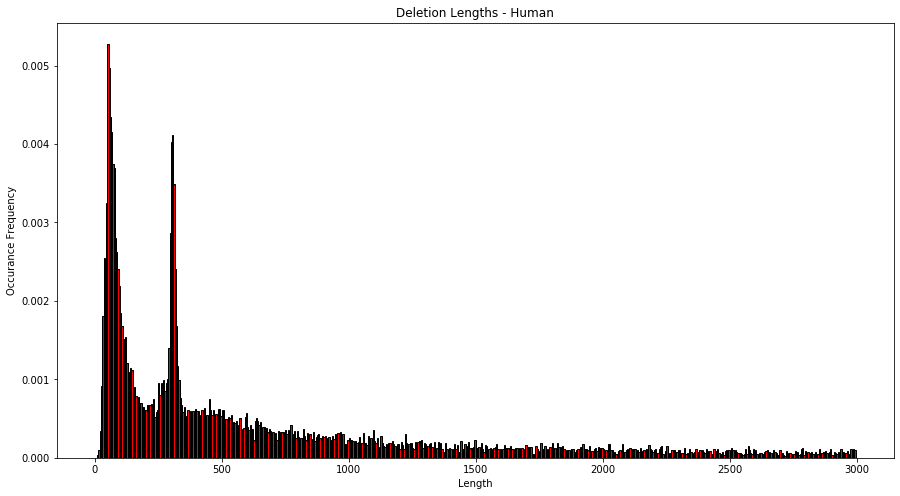

In [122]:
fig, ax = plt.subplots(figsize=(15,8))

my_bins = range(0, 3000, 5)

plt.hist(deletion_lengths, bins=my_bins, density=True, histtype='bar', color="red", edgecolor='black')
plt.title("Deletion Lengths - Human")
plt.xlabel("Length")
plt.ylabel("Occurance Frequency")
plt.show()
#plt.xticks(np.arange(0, 3001, 100))

Making histogram of sequence lengths to see peak at 250-350 million length
Since there is a big peak at this sequence length I will compute the similarity of these sequences.
* look between 250 and 350 length

In [91]:
write_fasta(sequences_to_write_human, "human/human_seq_of_interest.fsa")

Success! File written


In [92]:
sequences_to_write_human

{'seq0': '\nCCCACCGACCAACCCCGGGAACCGCCTCCCACTCCCCCCGCAACCCCGGGAACCGCCTCC\nCGCTCCCCCCACCAACCCCGGGAACCGCCTCCCGCTCCCCCCACCAACCCCGGGAACCGC\nCTCCCGCTCCCCCCACCAACCCCGGGAACCGCCTCCCGCTCCCCCCACCAACCCCGGGAA\nCCGCCTCCCGCTCCCCCCACCAACCCCGGGAACCGCCTCCCGCTCCCCCCACCAACCCCG\nGGAACCGCCTCCCGCTCCCCCCACCAACCCCGGGAACCGCCTCCCG',
 'seq1': '\ngaactgcttgaacccgggaggcggaggttgcagtaagccgagatcgcgccactgcactcc\nagcctgggcgacagagcgagactgtgtctcaaaaaaaaataaataaataaaaTTGAgaga\ncagggtggggctgtcacccaggctgcagtggcgcaatcatggctcactcaaactcctggg\nctcaagcgtcctcccgcctccacctccgcctcccaaatagctgggactataggcacgcac\nccaccacgccaggctaatttAAAAACAAAATTTTggccaggcgcagtggctcactcttgt\naa',
 'seq2': '\ntaaTggccgggcgcggtggctcacgcctgtaatcccagcactttgggaggccgaggcggg\ncggatcacgaggtcaggagatcgagaccatcccggctaaaacggtgaaaccccgtctcta\nctaaaaatacaaaaaattagccgggcgtagtggcgggcgcctgtagtcccagctacttgg\ngaggctgaggcaggagaatggcatgaacccgggaggcggagcttgcagtgagccgagatc\nccgccactgcactccagcctgggcgacagagcgagactccgtctcaaaaaaaaaaaaaaa\naaaaaaa',
 'seq3': '\nagacagagacagagaggcag

## COW - DONE

In [115]:
dict_cow = process("cow_filtered.vcf", "cow.fa", "cow")

Process completed


In [116]:
deletion_lengths_cow = []
filtered_dict_cow = {}
sequences_to_write_cow = {}
for chrom in dict_cow:
    for i in dict_cow[chrom]:
        length = i[1]-i[0]
        if(length >= 250 and length <= 350):
            #write this sequence to a fasta file 
            current_seq = len(sequences_to_write_cow)
            begin = i[0]
            end = i[1]
            #x=os.system(f'samtools faidx human/hg38.fa {chrom}:{begin}-{end} >> human/human_seq_of_interest.fa')
            status, output = subprocess.getstatusoutput(f'samtools faidx cow/cow.fa {chrom}:{begin}-{end}')
            result = output[output.find('\n'):]
            sequences_to_write_cow[f'seq{current_seq}'] = result
            
            #add to filtered sequence 
            if chrom in filtered_dict_cow:
                filtered_dict_cow[chrom].append([i[0],i[1]])
            else:
                filtered_dict_cow[chrom]=[[i[0],i[1]]]
        deletion_lengths_cow.append(length)
        

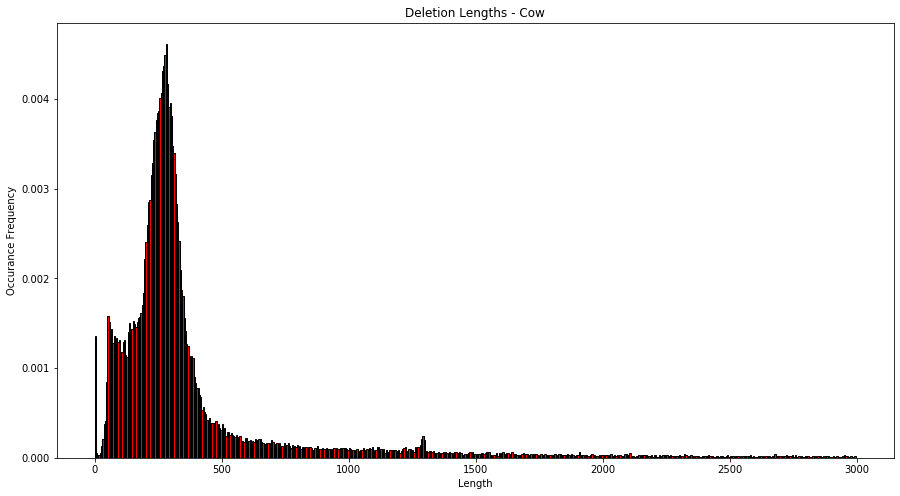

In [119]:
fig, ax = plt.subplots(figsize=(15,8))

my_bins = range(0, 3000, 5)

plt.hist(deletion_lengths_cow, bins=my_bins, density=True, histtype='bar', color="red", edgecolor='black')
plt.title("Deletion Lengths - Cow")
plt.xlabel("Length")
plt.ylabel("Occurance Frequency")
plt.show()
#plt.xticks(np.arange(0, 3001, 100))

In [120]:
write_fasta(sequences_to_write_cow, "cow/cow_seq_of_interest.fa") 

Success! File written


## CHICKEN - DONE

In [96]:
dict_chicken = process("chicken_filtered.vcf", "GCA_000002315.5_GRCg6a_genomic_chicken.fa", "chicken")

Process completed


In [102]:
deletion_lengths_chicken = []
filtered_dict_chicken = {}
sequences_to_write_chicken = {}
for chrom in dict_chicken:
    for i in dict_chicken[chrom]:
        length = i[1]-i[0]
        if(length >= 50 and length <= 150):
            #write this sequence to a fasta file 
            current_seq = len(sequences_to_write_chicken)
            begin = i[0]
            end = i[1]
            #x=os.system(f'samtools faidx human/hg38.fa {chrom}:{begin}-{end} >> human/human_seq_of_interest.fa')
            status, output = subprocess.getstatusoutput(f'samtools faidx chicken/GCA_000002315.5_GRCg6a_genomic_chicken.fa {chrom}:{begin}-{end}')
            result = output[output.find('\n'):]
            sequences_to_write_chicken[f'seq{current_seq}'] = result
            
            #add to filtered sequence 
            if chrom in filtered_dict_chicken:
                filtered_dict_chicken[chrom].append([i[0],i[1]])
            else:
                filtered_dict_chicken[chrom]=[[i[0],i[1]]]
        deletion_lengths_chicken.append(length)
        

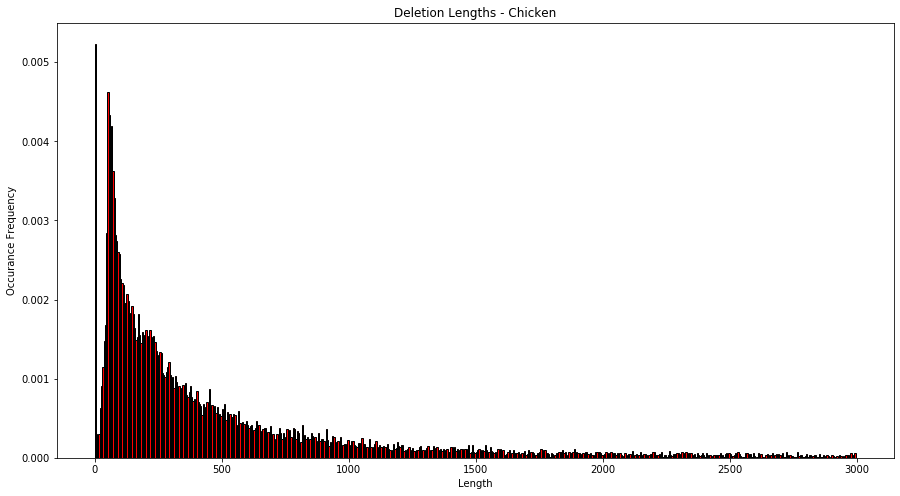

In [127]:
fig, ax = plt.subplots(figsize=(15,8))

my_bins = range(0, 3000, 5)

plt.hist(deletion_lengths_chicken, bins=my_bins, density=True, histtype='bar', color="red", edgecolor='black')
plt.title("Deletion Lengths - Chicken")
plt.xlabel("Length")
plt.ylabel("Occurance Frequency")
plt.show()
#plt.xticks(np.arange(0, 3001, 100))

In [107]:
write_fasta(sequences_to_write_chicken, "chicken/chicken_seq_of_interest.fa") 

Success! File written


In [108]:
sequences_to_write_chicken

{'seq0': '\nggtTGTATGGGATGTATAGGGGATgtatggggtggatatggggtggatatggggtgtatg\ngggtggatatggggtgtatggggtggATACGGGGGTgtatggggtggatatggggtggat\natggggctgtatggggctgtatggg',
 'seq1': '\ntaggatcatggaaccacagaaccataggatcataggatcatagggtcatagaaccatagg\natcacGGAACCACAGAACCATcggat',
 'seq2': '\ntgtatggggctgtaAGGGGCTGTATAGGGCTGTATAGAGCTGTATAGGGCTGTATGGAGC\nTGTATAGGGCTGTATAAAGCTGTatagggctgtatggggctATATAGAgctgtatggggc\ntgtatggggctgtaa',
 'seq3': '\nGTGCCCAGCAAAAGTGAAGAGCCTCACTGAGCTGCCCAGTACTCACTGCTGCTCATCCTG\nCTGGT',
 'seq4': '\nCGTCCCATAATGCTTGGGGATGTGGGATTGCCTCTTCTGTAGGGCTTGGGGGTGTGGGAT\nGGCCCCCTCTGTAGGGCTTGGGGATGAAGGATGGCCCGTCCCATAATGCTTGGGGATGTG\nGGATTGCCTCTTC',
 'seq5': '\ncactgtgcagtgcCATGCCATACTGTGCTATGCtatgcagtgcagtgctgcaccgtgctg\ntgcaatgctgtgctgtgcagtgctgcacta',
 'seq6': '\nGCCCTATCCTGATGTAGATGCTGGCTGTGCTGACCCGTCCTGGTGTAGGTGGTAGCTGTG\nATGCCCCA',
 'seq7': '\nGTGAGTCCAAACACCAGTGCTGGTGAGTCCACGTCCCAGTGCTGGTGAGTCCACACTCCA\nGTGCTGGTGATTCCACATCCCAGTGCTGGTGAGTCCACATCCCACTGTGGTGAGTCCACA\nC',
 'seq8': '\nG

## HORSE - DONE

In [124]:
dict_horse = process("horse_filtered.vcf", "Equus_caballus.EquCab3.0.dna.toplevel.fa", "horse")

Process completed


In [125]:
deletion_lengths_horse = []
filtered_dict_horse = {}
sequences_to_write_horse = {}
for chrom in dict_horse:
    for i in dict_horse[chrom]:
        length = i[1]-i[0]
        if(length >= 200 and length <= 300):
            #write this sequence to a fasta file 
            current_seq = len(sequences_to_write_horse)
            begin = i[0]
            end = i[1]
            #x=os.system(f'samtools faidx human/hg38.fa {chrom}:{begin}-{end} >> human/human_seq_of_interest.fa')
            status, output = subprocess.getstatusoutput(f'samtools faidx horse/Equus_caballus.EquCab3.0.dna.toplevel.fa {chrom}:{begin}-{end}')
            result = output[output.find('\n'):]
            sequences_to_write_horse[f'seq{current_seq}'] = result
            
            #add to filtered sequence 
            if chrom in filtered_dict_horse:
                filtered_dict_horse[chrom].append([i[0],i[1]])
            else:
                filtered_dict_horse[chrom]=[[i[0],i[1]]]
        deletion_lengths_horse.append(length)
        

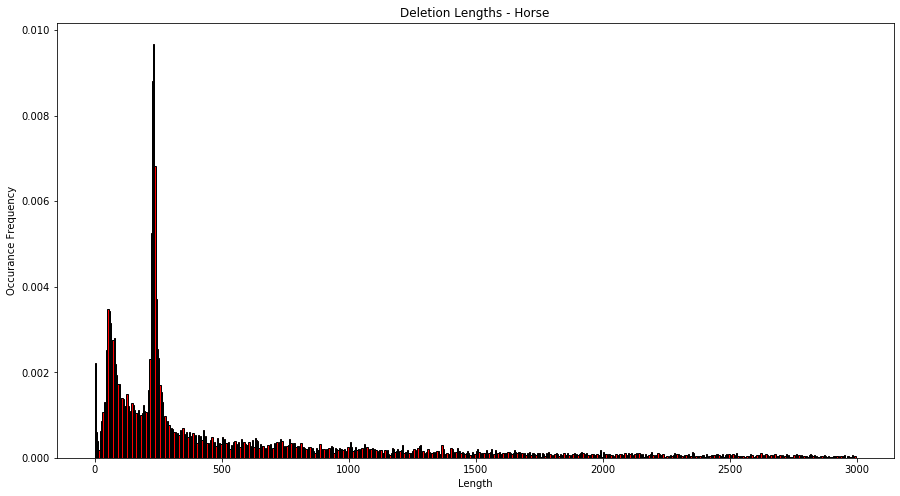

In [129]:
fig, ax = plt.subplots(figsize=(15,8))

my_bins = range(0, 3000, 5)

plt.hist(deletion_lengths_horse, bins=my_bins, density=True, histtype='bar', color="red", edgecolor='black')
plt.title("Deletion Lengths - Horse")
plt.xlabel("Length")
plt.ylabel("Occurance Frequency")
plt.show()
#plt.xticks(np.arange(0, 3001, 100))

In [130]:
write_fasta(sequences_to_write_horse, "horse/horse_seq_of_interest.fa") 

Success! File written


## PIG - DONE

In [132]:
dict_pig = process("pig_filtered.vcf", "GCF_000003025.6_Sscrofa11.1_genomic.fa", "pig")

Process completed


In [133]:
deletion_lengths_pig = []
filtered_dict_pig = {}
sequences_to_write_pig = {}
for chrom in dict_pig:
    for i in dict_pig[chrom]:
        length = i[1]-i[0]
        if(length >= 250 and length <= 350):
            #write this sequence to a fasta file 
            current_seq = len(sequences_to_write_pig)
            begin = i[0]
            end = i[1]
            #x=os.system(f'samtools faidx human/hg38.fa {chrom}:{begin}-{end} >> human/human_seq_of_interest.fa')
            status, output = subprocess.getstatusoutput(f'samtools faidx pig/GCF_000003025.6_Sscrofa11.1_genomic.fa {chrom}:{begin}-{end}')
            result = output[output.find('\n'):]
            sequences_to_write_pig[f'seq{current_seq}'] = result
            
            #add to filtered sequence 
            if chrom in filtered_dict_pig:
                filtered_dict_pig[chrom].append([i[0],i[1]])
            else:
                filtered_dict_pig[chrom]=[[i[0],i[1]]]
        deletion_lengths_pig.append(length)
        

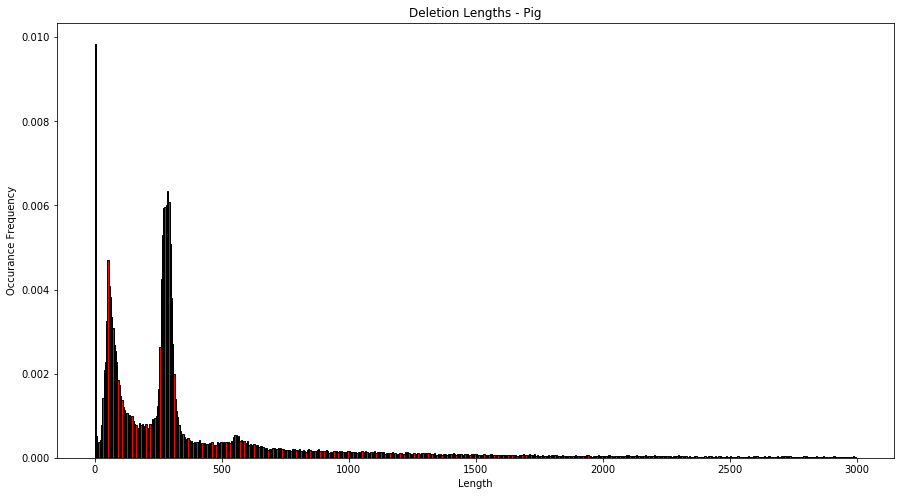

In [136]:
fig, ax = plt.subplots(figsize=(15,8))

my_bins = range(0, 3000, 5)

plt.hist(deletion_lengths_pig, bins=my_bins, density=True, histtype='bar', color="red", edgecolor='black')
plt.title("Deletion Lengths - Pig")
plt.xlabel("Length")
plt.ylabel("Occurance Frequency")
plt.show()
#plt.xticks(np.arange(0, 3001, 100))

In [137]:
write_fasta(sequences_to_write_pig, "pig/pig_seq_of_interest.fa") 

Success! File written


## FULL WORKFLOW

Copy files down from aws: do this for both the vcf and fa files <br>
* aws s3 cp {aws path} {dest} 
<br>

Unzip the vcf.gz files <br>
* bgzip -d pig_sites.smoove.square.vcf.gz
<br>

Use bcftools to filter out just deletions <br>
* bcftools view -i 'SVTYPE="DEL"' vcf > output
<br>

Run file

This finds regions of sim between the two fasta files
* blastn -query human_seq_of_interest.fsa -subject human_seq_of_interest.fsa -out results2.txt

**BLASTn** (Nucleotide BLAST): compares one or more nucleotide query sequences to a subject nucleotide sequence or a database of nucleotide sequences. This is useful when trying to determine the evolutionary relationships among different organisms (see Comparing two or more sequences below).


This is how you make a local db given a fasta file that we are writing out
* makeblastdb -in human_seq_of_interest.fsa -parse_seqids -blastdb_version 5 -dbtype prot -out human -title -human
* makeblastdb -in horse_subgenus_file_thoroughbred.fsa -parse_seqids -blastdb_version 5 -dbtype nucl -out thoroughbred -title thoroughbred


Look at sample names of vairaints for human samples (look like NC109265). Human samples are pulled from a public database called 1000 genomes so I can take the sample numbers and see their heritage. Once I get this data look for significant sequence alignments within populations to confirm biologically meaningful relationships. 

Additionally for the animals I am extracting the sample numbers and looking at their sub genuses. I can get this information from the National Library of Medicine - Sequence Read Archive: https://trace.ncbi.nlm.nih.gov/Traces/?view=run_browser&acc=SRR516118&display=metadata. Once I have their sub genuses I will look to see if there are significant alignments within populations to confirm biologically meaningful relationships and see if traits are effected by certain SVs.

## PARSING XML OUTPUT IN PYTHON 

In [75]:
from Bio.Blast import NCBIXML


In [5]:
for blast_record in NCBIXML.parse(open("human/results_South_Asian_Ancestry.xml")):
    for alignment in blast_record.alignments:
        for hsp in alignment.hsps:
            print("*****Alignment****")
            print("sequence:", alignment.title)
            print("length:", alignment.length)
            print("e-value:", hsp.expect)
            print(hsp.query)
            print(hsp.match)
            print(hsp.sbjct)

*****Alignment****
sequence: seq1 seq1
length: 307
e-value: 1.61323e-163
TAATGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCATGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
TAATGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCATGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAA
***

||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAAGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq1609 seq1609
length: 309
e-value: 2.71868e-156
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCATGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAA
|||||||

|||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGCCTCAAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq817 seq817
length: 308
e-value: 1.26488e-154
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCATGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAA
|||||||||||

CCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCATGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||
CCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCTGTCTCAAAAAAAAAAAAA
*****Alignment****
sequence: seq532 seq532
length: 295
e-value: 7.6126e-152
GCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGG

GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGATGGGCAGATCACGAGGTCAGGAGATCGAGACCATCCTGGCTAACACGGTGAAACCCCGTCTCTACTAAAAATACAAAAA-TTAGCCGGGCATGGTGGCGCGTGCCTGTAGTCCCAGCTACACAGGAGGCTGAGGCAGGAGAATGGTGTGAACCCGGGAGGCGGAGCTTGCAGTGAGTCGAGATCGCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAAACTCCGTCTCAAAAAAAAAAAAAAAAAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||  |||| ||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||| |||||||||| |||| ||| | |||||||||||||||||| | |||||||||||||||||||||| |||||||||||||||||||||||||||||| | ||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTGGTAGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCAAGATCGCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq753 seq753
length: 322
e-value: 1.28311e-134
GGGCCGGGCGCGGTGGC

e-value: 7.72233e-132
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGATGGGCAGATCACGAGGTCAGGAGATCGAGACCATCCTGGCTAACACGGTGAAACCCCGTCTCTACTAAAAATACAAAAA-TTAGCCGGGCATGGTGGCGCGTGCCTGTAGTCCCAGCTACACAGGAGGCTGAGGCAGGAGAATGGTGTGAACCCGGGAGGCGGAGCTTGCAGTGAGTCGAGATCGCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAAACTCCGTCTCAAAAAAAAAAAAAAAAAAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||  |||| |||||||||||||||||||||||||||||| |||||| ||||||||||||||||||||||||||||||||||| |||||||||| | |||||| | ||||||||||||||||||   |||||||||||||||||||||| |||||||||||||||||||||||||||||| |||||| |||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq660 seq660
length: 340
e-value: 7.722

e-value: 3.59285e-130
GCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGATGGGCAGATCACGAGGTCAGGAGATCGAGACCATCCTGGCTAACACGGTGAAACCCCGTCTCTACTAAAAATAC-AAAAATTAGCCGGGCATGGTGGCGCGTGCCTGTAGTCCCAGCTACACAGGAGGCTGAGGCAGGAGAATGGTGTGAACCCGGGAGGCGGAGCTTGCAGTGAGTCGAGATCGCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAAACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAA
||||||||||||||||||||||||||||||||||||||||||||||||||  |||| |||||||||||||||||||||||||||||| |||||| |||||||||||||||||||||||||||||| ||||||||||||||| | |||||| | ||||||||||||||||||   |||||||||||||||||||||| |||||||||||||||||||||||||||||| ||||||| ||||||||||||||||||||||||||||||||| |||| |||||||||||||||||||||||||||
GCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCTGTCTCAAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq36 seq36
length: 299
e-value: 3.59285

length: 316
e-value: 9.60834e-156
TTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCTGCCACCGCGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGTTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||| |||||||||||||||||
TTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACCGCGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTAAGCCACCGCGCCCGGCC
*****Alignment****
sequence: seq1110 seq1110
length: 314


e-value: 2.07984e-152
TTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCTGCCACCGCGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGTTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
|||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCAGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCACTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGTGCCCGCCACCGCGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
*****Alignment****
sequence: seq1421 seq1421
length: 318
e-value: 2.0

length: 335
e-value: 1.26958e-139
CTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCTGCCACCGCGCCCGGCTAATTTTTT--GTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGTTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||| ||||||||||||  |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||
CTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACCGCGCCTGGCTAATTTTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
*****Alignment****
sequence: seq1742 seq1742
length: 335
e-value: 9.05488e-17
TTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGC
|

sequence: seq1145 seq1145
length: 331
e-value: 9.70917e-161
TTTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGCGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCTACCACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGC
|||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTC-TCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGCGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCTACCACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGC
*****Alignment****


length: 301
e-value: 2.73798e-151
TTTTTTTTTTTTTTTTTTGAGACGGAGTCTTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGCGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCTACCACGCCCGGCTAA--TTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||  |||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTGAGACGGAGTC-TCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGCGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCTACCACGCCCGGCTAATTTTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGACTACAGGCGTGAGCCACCGCGCCCGGCC
*****Alignment****
sequence: seq802 seq802
length: 308
e-

*****Alignment****
sequence: seq737 seq737
length: 303
e-value: 4.58161e-149
TTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGCGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCTACCACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||| || |||||||||||||||||||||||||||||||||||||||||||||||| |||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCT-CGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
*****Alignm

*****Alignment****
sequence: seq10 seq10
length: 264
e-value: 1.09911e-139
GAGGCCAAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATTGTGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAA
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GAGGCCAAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATTGTGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq1734 seq1734
length: 312
e-value: 2.37914e-136
GAGGCCAAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCT

sequence: seq758 seq758
length: 305
e-value: 8.61768e-131
GAGGCCAAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATTGTGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAA
|||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||   |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCTCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq737 seq737
length: 303
e-value: 8.61768e-131
GAGGCCAAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCT

*****Alignment****
sequence: seq633 seq633
length: 301
e-value: 1.44204e-128
GAGGCCAAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATTGTGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAA
|||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||   |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTCCTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq599 seq599
length: 302
e-value: 1.44204e-128
GAGGCCAAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCC

*****Alignment****
sequence: seq11 seq11
length: 297
e-value: 5.64052e-158
AGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTAGATCATGAAGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATATAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
AGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTAGATCATGAAGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATATAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAA
*****Alignment****
sequence: se

*****Alignment****
sequence: seq1543 seq1543
length: 307
e-value: 4.42252e-149
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTAGATCATGAAGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATATAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTC-AAAAAAAA
||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGCGGTGGCGGGTGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCCAAAAAAAA
*****Alignment****
sequence

*****Alignment****
sequence: seq291 seq291
length: 291
e-value: 1.24715e-139
GCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTAGATCATGAAGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATATAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAA
||||||||||||||||||||||||||| ||||||||| |||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GCCTGTAATCCCAGCACTTTGGGAGGCGGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAA
*****Alignment****
sequence: seq1086 seq1086
length: 339
e-value: 4.48554e-139
GGCCGGGCGCGGT

*****Alignment****
sequence: seq13 seq13
length: 307
e-value: 1.61323e-163
AGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCTGGGTAACACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGAGGTGGCGGGCGCCTGTAGTCCCAGCTACTCCGGAGGCTGAGGCAGGAGAATGGCGTGAACTCCAGGGGGCGGAGCCTGCAGTGAGCCGAGATTGCGCCACTGCACTCCAGCCTGGACGACAGCGAGACTCCGTCTCAAAAAAAAAAAAAAATAATAATAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
AGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCTGGGTAACACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGAGGTGGCGGGCGCCTGTAGTCCCAGCTACTCCGGAGGCTGAGGCAGGAGAATGGCGTGAACTCCAGGGGGCGGAGCCTGCAGTGAGCCGAGATTGCGCCACTGCACTCCAGCCTGGACGACAGCGAGACTCCGTCTCAAAAAAAAAAAAAAATAATAATAAAA
*

CGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCTGGGTAACACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGAGGTGGCGGGCGCCTGTAGTCCCAGCTACTCCGGAGGCTGAGGCAGGAGAATGGCGTGAACTCCAGGGGGCGGAGCCTGCAGTGAGCCGAGATTGCGCCACTGCACTCCAGCCTGGACGAC--AGCGAGACTCCGTCTCAAAAAAAAAAAAAAATAATAATAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||  ||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||| || || |||||||| |||||||||||||||| |||||||||||||||||||||| ||||  ||||||||||||||||||||||||||||||| || || ||||
CGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCTGGCTAACACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAAC-CCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCGCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAA-AA-AAAA
*****Alignment****
sequence: seq1626 seq1626
length: 304
e-value: 1.68319e-133
GGCCGGGCGCGGTGG

|||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||| |||||| ||||||||||||||||||||||||  || ||||||||||||||||| |||||||||||||||||||||||||||||  ||||||||||||||||||||||||||||| || || |||||||| |||||||||||||||| |||||||||||||||||||||| ||||  ||||||||||||||||||||||||||||||| || || ||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCAAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCTGGCTAACACAGTGAAACCCCGTCTCTACTAAAAAACACAAAAAAATTAGCCGGGCGTGGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAAC-CCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCGCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq884 seq884
length: 308
e-value: 3.64346e-130
AGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCTGGGTAACACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGAGGTGGCGGGCGCCTGTAGTCCCAGCTACTCCGGAGGCTGAGGCAGGAGAATGGCGTGAACTCCAGGGGGCGGAGCCTGCAGTGAGCCGAGATTGCGCCACTGCACTCCAGCCTGGACGACAG--CGAGACTCCGTCTCAAAAAAAAAAAAAAATAA

e-value: 7.21611e-152
TTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCATTGCAAGCTCCACCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGC
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGC
*****Alignment****
sequence: seq755 seq755
length: 313
e-value: 7.21611e-152
TTTTTTTTTTTGAGACGGAGTC

TTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCAGGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCG-TTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGC
*****Alignment****
sequence: seq727 seq727
length: 298
e-value: 5.618e-148
TTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCATTGCAAGCTCCACCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGC
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGT

TTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCATTGCAAGCTCCACCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGC
|||||||||||||||||||||||||||||||||||||||||||||||||||||||  ||||||||||| |||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTT-AGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGC
*****Alignment****
sequence: seq493 seq493
length: 314
e-value: 2.6138e-146
TTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAG

sequence: seq16 seq16
length: 316
e-value: 1.65192e-168
CTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCCCCCT
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
CTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGG

*****Alignment****
sequence: seq295 seq295
length: 317
e-value: 1.00126e-160
TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGCATTTTTAGTAGAGACGGGGTTTCACCGTTTTAGCTGGGATGGTCTCGATCTCCTGACCTCGCGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCA

e-value: 2.16734e-157
TTTTTTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGC
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCACCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCATTTTAGCCGGGATGGTCTCGATCTTCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGC
*****Alignment****
sequence: seq1874 seq1874
length

sequence: seq708 seq708
length: 319
e-value: 4.62703e-159
CGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCTACAGAGCGAGACTCCGTCTCAAAAAAAAAAAATAAATAAATAAAAAAAAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||| ||| ||| |||||||||||
CGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAATGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||| ||| ||| ||||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAA-AAA-AAA-AAAAAA
*****Alignment****
sequence: seq1130 seq1130
length: 300
e-value: 1.29562e-154
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCTACAGAGCGAGACTCCGTCTCAAAAAAAAAAAATAAATAAA
|

length: 312
e-value: 2.16803e-152
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCTACAGAGCGAGACTCCGTCTCAAAAAAAAAAAATAAATAAATAAAAAAAAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||| |||||||||||||||||||||||||||||||| ||| ||| |||||||||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCTGGCTAACACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCGCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAA-AAA-AAA-AAAAAAAAAAA
*****Alignment****
seque

AGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAA
*****Alignment****
sequence: seq645 seq645
length: 316
e-value: 9.54061e-161
AGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAA
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
AGGCCGGGCGCGGT

e-value: 2.67148e-156
GCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCACGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGCGGTGGCGGGTGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAA
*****Alignment****
sequence: seq1065 seq1065
length: 329
e-value: 2.67148e-

|||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
CTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCACGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAGTACAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAA
*****Alignment****
sequence: seq1512 seq1512
length: 327
e-value: 1.61923e-148
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACT-----AAAAATACAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCG-TGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAA
|||||||||||||||||||||||||||||||||||||||

e-value: 3.0684e-140
GGCGCCTGTAGTCCCACCTACTCAGGAGGCTGAGGCAGGAGAATGGCATGAACCTGGGAGGCGGAGCTTGCAGTGAGCCGAGATCATGCCACTGCACCCCAGCCTGGGCAACAGAGCGAGACTCCGTCTCAAAACAAAACAAAACACAACAAAAAAAAACAGAAATAGGCCGGGTGCAGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGAGGAGTCAGATCACTTGAGGTCAGGAGTTCGAGACCAGCCTGGCCA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GGCGCCTGTAGTCCCACCTACTCAGGAGGCTGAGGCAGGAGAATGGCATGAACCTGGGAGGCGGAGCTTGCAGTGAGCCGAGATCATGCCACTGCACCCCAGCCTGGGCAACAGAGCGAGACTCCGTCTCAAAACAAAACAAAACACAACAAAAAAAAACAGAAATAGGCCGGGTGCAGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGAGGAGTCAGATCACTTGAGGTCAGGAGTTCGAGACCAGCCTGGCCA
*****Alignment****
sequence: seq1764 seq1764
length: 319
e-value: 1.22714e-64
GCCTGTAGTCCCACCTACTCAGGAGGCTGAGGCAGGAGAATGGCATGAACCTGGGAGGCGGAGCTTGCAGTGAGCCGAGATCATGCCACTGCACCCCAGCCTG

length: 316
e-value: 7.76044e-27
GGCCGGGTGCAGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGAGGAGTCAGATCACTTGAGGTCAGGAGTTCGAGACCAGCCTGGC
||||||| || ||||||||||||||||||||||||||||||||||||||||| || | | ||||||  ||||||||||| ||||||||| || |||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGG-G-CGGATCAC--GAGGTCAGGAGATCGAGACCATCCCGGC
*****Alignment****
sequence: seq1509 seq1509
length: 315
e-value: 5.74987e-58
GGCGCCTGTAGTCCCACCTACTCAGGAGGCTGAGGCAGGAGAATGGCATGAACCTGGGAGGCGGAGCTTGCAGTGAGCCGAGATCATGCCACTGCACCCCAGCCTGGGCAACAGAGCGAGACTCCGTCTCAAAACAAAACAAAACACAACAAAAAAAAA
|||||||||||||||| |||||  ||||||||||||||||||||||| |||||| ||||||||||||||||||||||||||||||  |||||||||| ||||||||||| |||||||||||||||||||||||| |||| |||| | || |||||||||
GGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq1509 seq1509
length: 315
e-value: 3.61058e-25
GGCCGGGTGCAGTGGCTCACGCCTGTAATCCCAGCACTTT

sequence: seq1407 seq1407
length: 311
e-value: 3.61058e-25
GGCCGGGTGCAGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGAGGAGTCAGATCACTTGAGGTCAGGAGTTCGAGACCAGCCTGGC
||||||| || ||||||||||||||||||||||||||||||||||||||||| || | | ||||||  ||||||||||| | ||||||| || |||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGG-G-CGGATCAC--GAGGTCAGGAGATTGAGACCATCCCGGC
*****Alignment****
sequence: seq1381 seq1381
length: 309
e-value: 2.06802e-57
GGCGCCTGTAGTCCCACCTACTCAGGAGGCTGAGGCAGGAGAATGGCATGAACCTGGGAGGCGGAGCTTGCAGTGAGCCGAGATCATGCCACTGCACCCCAGCCTGGGCAACAGAGCGAGACTCCGTCTCAAAACAAAACAAAACACAACAAAAAAAAA
|||||||||||||||| |||||  ||||||||||||||||||||||| |||||| ||||||||||||||||||||||||||||||  |||||||||| ||||||||||| |||||||||||||||||||||||| |||| |||| | || |||||||||
GGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAA-AA-AAAAAAAAA
*****Alignment****
sequence: seq1381 seq1381
length: 309
e-value: 3.61058e-25
GGCCGGGTGCAGTG

sequence: seq1713 seq1713
length: 307
e-value: 2.67515e-56
GGCGCCTGTAGTCCCACCTACTCAGGAGGCTGAGGCAGGAGAATGGCATGAACCTGGGAGGCGGAGCTTGCAGTGAGCCGAGATCATGCCACTGCACCCCAGCCTGGGCAACAGAGCGAGACTCCGTCTCAAAACAAAACAAAACACAACAAAAAAAA
|||||||||||||||| |||||  ||||||||||||||||||||||| |||||| ||||||||||||||||||||||||||||||  |||||||||| ||||||||||| |||||||||||||||||||||||| |||| |||| | || ||||||||
GGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAA-AAAA-AAAA-AGAA-AAAAAAAA
*****Alignment****
sequence: seq1713 seq1713
length: 307
e-value: 3.61058e-25
GGCCGGGTGCAGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGAGGAGTCAGATCACTTGAGGTCAGGAGTTCGAGACCAGCCTGGC
||||||| || ||||||||||||||||||||||||||||||||||||||||| || | | ||||||  ||||||| ||| ||||||||| || |||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGG-G-CGGATCAC--GAGGTCAAGAGATCGAGACCATCCCGGC
*****Alignment****
sequence: seq1684 seq1684
length: 318
e-value: 2.67515e-56
GGCGCCTGTAGTCCCAC

sequence: seq384 seq384
length: 315
e-value: 2.67515e-56
GGCGCCTGTAGTCCCACCTACTCAGGAGGCTGAGGCAGGAGAATGGCATGAACCTGGGAGGCGGAGCTTGCAGTGAGCCGAGATCATGCCACTGCACCCCAGCCTGGGCAACAGAGCGAGACTCCGTCTCAAAACAAAACAAAACACAACAAAAAAAAA
|||||||||||||||| |||||  ||||||||||||||||||||||| |||||| |||||||||||||||||||||||||||||   |||||||||| ||||||||||| |||||||||||||||||||||||| |||| |||| | || |||||||||
GGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq384 seq384
length: 315
e-value: 2.15769e-27
AGGCCGGGTGCAGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGAGGAGTCAGATCACTTGAGGTCAGGAGTTCGAGACCAGCCTGGC
|||||||| || ||||||||||||||||||||||||||||||||||||||||| || | | ||||||  ||||||||||| ||||||||| || |||
AGGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGG-G-CGGATCAC--GAGGTCAGGAGATCGAGACCATCCCGGC
*****Alignment****
sequence: seq380 seq380
length: 329
e-value: 2.67515e-56
GGCGCCTGTAGTCCCAC

*****Alignment****
sequence: seq91 seq91
length: 306
e-value: 3.46053e-55
GGCGCCTGTAGTCCCACCTACTCAGGAGGCTGAGGCAGGAGAATGGCATGAACCTGGGAGGCGGAGCTTGCAGTGAGCCGAGATCATGCCACTGCACCCCAGCCTGGGCAACAGAGCGAGACTCCGTCTCAAAACAAAACAAAACACAACAAAAAAAAA
|||||||||||||||| |||||  ||||||||||||||||||||||| |||||| ||||||||||||||||||||||||||||||  |||||||||| ||||||||||| |||||| ||||||||||||||||| |||| |||| | || |||||||||
GGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGGGAGACTCCGTCTCAAAAAAAAA-AAAA-A-AA-AAAAAAAAA
*****Alignment****
sequence: seq91 seq91
length: 306
e-value: 7.76044e-27
GGCCGGGTGCAGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGAGGAGTCAGATCACTTGAGGTCAGGAGTTCGAGACCAGCCTGGC
||||||| || ||||||||||||||||||||||||||||||||||||||||| || | | ||||||  ||||||||||| ||||||||| || |||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGG-G-CGGATCAC--GAGGTCAGGAGATCGAGACCATCCCGGC
*****Alignment****
sequence: seq66 seq66
length: 268
e-value: 3.46053e-55
GGCGCCT

length: 308
e-value: 4.50155e-159
GCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCGGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAA
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCAGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq127 seq127
lengt

*****Alignment****
sequence: seq597 seq597
length: 304
e-value: 2.70924e-156
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAA-TTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCGGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAA
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAAGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAA
*****Ali

length: 303
e-value: 5.86447e-153
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCGGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||| |||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGAATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACCTGGGAGGCTGAGGCAGGAGAATGGCATGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGCCTCAAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq71 seq71
length: 317
e

TTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACCGCGCCCGGCTAATTTTTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
|||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||   ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGTCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACCGCGCCCGGCTAATTTTTT---GTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
*****Alignment****
sequence: seq614 seq614
length: 320
e-value: 

TTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACCGCGCCCGGCTAATTTTTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
|||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||   ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCAGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCACTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGTGCCCGCCACCGCGCCCGGCTAATTTTTT---GTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
*****Alignment****
sequence: seq1368 seq1368
length: 324
e-value

e-value: 6.09462e-138
TTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACCGCGCCCGGCTAATTTTTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGC
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||   |||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCACTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACCGCGCCCGGCTAA---TTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCAATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGC
*****Alignment****
sequence: seq973 seq973
length: 311
e-value: 6.09462e-138
TTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGC

e-value: 8.00909e-152
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCTGGCTAAAACGGTGAAACCCTGTCTCTACTAAAAAAAATACAAAAAATTAGCTGGGCGTGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCTGAGATTGTGCCACTGCAGTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||| ||||||||||||||   |||||||||||||| |||||| |||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||| ||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAA---TACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
*****Alignme

e-value: 4.85445e-144
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCTGGCTAAAACGGTGAAACCCTGTCTCTACTAAAAAAAATAC-AAAAAATTAGCTGGGCGTGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCTGAGATTGTGCCACTGCAGTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||| |||||||||||||||| ||||||||||||||||||| ||||||||||||||   ||| ||||||||||| |||||| |||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||   ||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGAGGGCGGATCACGAGGTCAAGAGATCGAGACCATCCCGGCTAAAACGGTGAAACCCCGTCTCTACTAAAAA---TACAAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
*****Alig

e-value: 3.77937e-140
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCTGGCT-AAAACGGTGAAACCCTGTCTCTACTAAAAAAAATACAAAAAATTAGCTGGGCGTGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCTGAGATTGTGCCACTGCAGTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
|||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||| ||||||||||||||| |||||||||   ||||||||||||||||||| |||||| |||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||| ||||| |||||   ||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
GGCCGGGCGCGGTGGCTCACCCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGCGGATCACGAGGTCAGGAGATCGAGACCATCCCGGCTAAAAACGGTGAAACCCCGTCTCTACT---AAAAATACAAAAAATTAGCCGGGCGTAGTGGCGGGCGCCTGTAGTCCCAGCTACTTGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAATGAGCCGAGATCCCGCCACTGCACTCCAGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: s

length: 322
e-value: 2.76758e-136
TTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCCCGCTCTTTAGCCCAGGCCGGATTGCAGTGGCACAATCTTGGCTCACTGCAAGCTCCGCCTCCCAGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACTGCGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTGTTAGCCAAGATGGTCTCGATCTCCTGACCTTGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCC
|||||||||||||||||||||||||||||||||| |||||| | |||||||| ||| ||||||||| |||||| |||||||||||||||||||||||| ||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||| ||||||  |||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCC
*****Alignment****
sequence: seq601 seq601
length: 311
e-value:

length: 323
e-value: 5.99075e-133
TTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCCCGCTCTTTAGCCCAGGCCGGATTGCAGTGGCACAATCTTGGCTCACTGCAAGCTCCGCCTCCCAGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACTGCGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTGTTAGCCAAGATGGTCTCGATCTCCTGACCTTGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCAGC
|||||||||||||||||||||||||||||||||| |||||| | |||||||| ||| |||||||||   |||| |||||||||||||||||||||||| ||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||| ||||||  |||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||
TTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGGGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGC
*****Alignment****
sequence: seq172 seq172
length: 306

length: 295
e-value: 3.6055e-130
TTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCCCGCTCTTTAGCCCAGGCCGGATTGCAGTGGCACAATCTTGGCTCACTGCAAGCTCCGCCTCCCAGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACTGCGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTGTTAGCCAAGATGGTCTCGATCTCCTGACCTTGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCA
||||||||||||||||||||||||||||||||||  ||||| | |||||||| ||| ||||||||| |||||| |||||||||||||||||||||||| ||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||| ||||||  |||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTTGCTCTGTCGCCCAGGCTGGAGTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCAAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTTTTAGCCGGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCA
*****Alignment****
sequence: seq207 seq207
length: 321
e-value: 3.6055e-130
TTTTTTTTTTTT

length: 320
e-value: 5.90295e-163
TTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACCGCGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCTGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACATGCGCCCGCCACCGCGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
*****Alignment****
sequence

sequence: seq523 seq523
length: 306
e-value: 5.94486e-158
TTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACCGCGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCTGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
|||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGTCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACCGCGCCCAGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
*****Alignment****
se

|||||||||||||||||||||||||||||||||||||||||||||||||||||     |  ||| ||||||||||| |||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||  ||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||| |||||| || |||||||||||||||||||||||||||||||||||||||||||||||||||||
TTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGC-----T--GGAGTGCAGTGGCGCGATCTCGGCTCACTGCAAGCTCCGCCTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACTACGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCGTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCGTGATCCGCCCGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCCACCGCGCCCGGCC
*****Alignment****
sequence: seq209 seq209
length: 313
e-value: 2.19952e-137
TTTTTTTTTTTTTTTTTTTTTTTTGAGACGGAGTCTCGCTCTGTCGCCCAGGCCGGACTGCGGACTGCAGTGGCGCAATCTCGGCTCACTGCAAGCTCCGCTTCCCGGGTTCACGCCATTCTCCTGCCTCAGCCTCCCGAGTAGCTGGGACTACAGGCGCCCGCCACCGCGCCCGGCTAATTTTTTGTATTTTTAGTAGAGACGGGGTTTCACCTTGTTAGCCAGGATGGTCTCGATCTCCTGACCTCATGATCCACCTGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAG

sequence: seq1449 seq1449
length: 313
e-value: 8.45131e-157
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCCACCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAATAAAATAAATAAA
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||  |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||| |||| ||| |||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAA--TTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGACCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAAA

e-value: 2.36646e-152
GCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCCACCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAATAAAA
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||  ||||||||||||||||||||||||||||||||||||||||||||||| ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||  |||||||||||||||||||||||||||||||||||||||| ||||
GCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATAC--AAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTGGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAAAAAAA
*****Alignment****
sequence: seq1738 seq1738
length: 314


*****Alignment****
sequence: seq1160 seq1160
length: 314
e-value: 2.41722e-137
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAAAATTAGCCGGGCGCGGTGGCGGGCGCCTGTAGTCCCAGCTACTCGGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAAGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCCACCTGGGCGACAGAGCGAGACTCCGTCTCAAAAAAAAAAAATAA-AATAAATAAA
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||  |||||| |||| |||||  || |||||| | ||| ||||||| ||||||||||||||||||||||||||||||||||| |||||||||||||||||||||||||||||||||||||||||||||||  |||||||||||||||||||||||||||||||||||||||| || || ||| |||
GGCCGGGCGCGGTGGCTCACGCCTGTAATCCCAGCACTTTGGGAGGCCGAGGCGGGTGGATCATGAGGTCAGGAGATCGAGACCATCCTGGCTAACAAGGTGAAACCCCGTCTCTACTAAAAATACAAAAAA--TTAGCCAGGCGTGGTGGTCGGTGCCTGTGGCCCC-GCTACTCTGGAGGCTGAGGCAGGAGAATGGCGTGAACCCGGGAGGCGGAGCTTGCAGTGAGCCGAGATTGCGCCACTGCAGTCCGCAGTCCGGCCTGGGCGACAGAGCGAGACTCCGT

KeyboardInterrupt: 

In [58]:
def print_record_info(filename):
    result=open(filename,"r")
    records= NCBIXML.parse(result)
    item=next(records)
    for alignment in item.alignments:
        for hsp in alignment.hsps:
            if hsp.expect <0.01:
                print('****Alignment****')
                print('sequence:', alignment.title) 
                print('length:', alignment.length)
                print('score:', hsp.score)
                print('gaps:', hsp.gaps)
                print('e value:', hsp.expect)
                print(hsp.query[0:90] + '...')
                print(hsp.match[0:90] + '...')
                print(hsp.sbjct[0:90] + '...')


In [59]:
print(print_record_info("human/results_South_Asian_Ancestry.xml"))

None


In [73]:
def display_histogram(filename, name_of_pop):
    e=[]
    for blast_record in NCBIXML.parse(open(filename,"r")):
        for alignment in blast_record.alignments:
            for hsp in alignment.hsps:
                e.append(hsp.expect)
    print(f'The min e value is {min(e)}')
    print(f'The max e value is {max(e)}')
    fig, ax = plt.subplots(figsize=(15,8))

    plt.hist(e,np.arange(0, 1*10**-150, 1*10**-152), density=True, histtype='bar', color="red", edgecolor='black') #
    plt.title(f'E value distribution for {name_of_pop} population')
    plt.xlabel("E value")
    plt.ylabel("Occurance Frequency")
    plt.show()
    
    

The function above takes blast output (in the format of an xml document) and reads through the records to obtain each 

The min e value is 0.0
The max e value is 2.707e-08


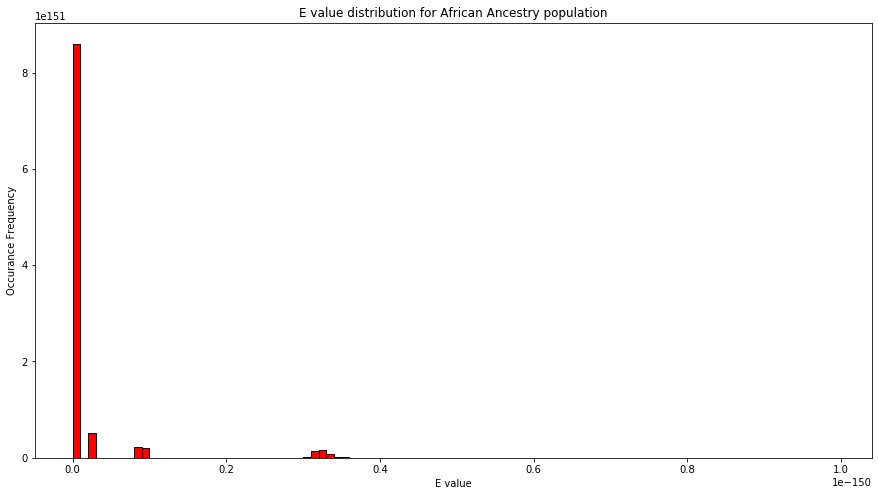

In [46]:
display_histogram("human/results_African_Ancestry.xml", "African Ancestry")

The min e value is 0.0
The max e value is 2.26406e-08


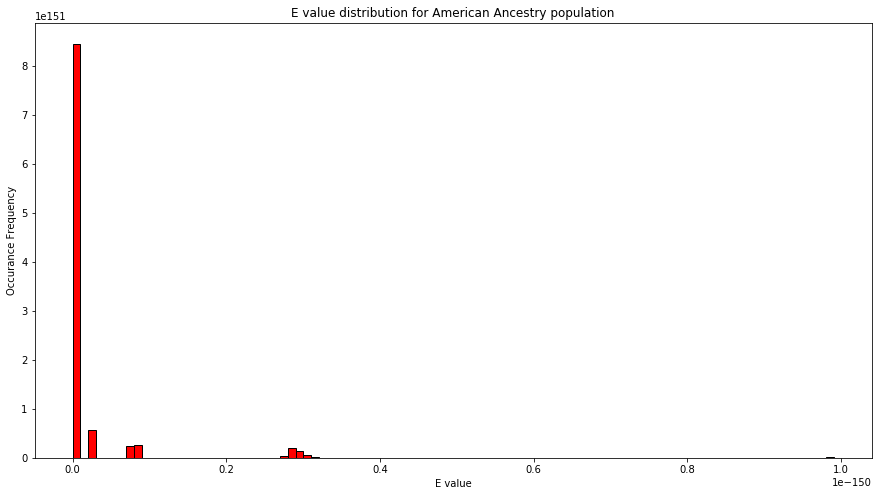

In [47]:
display_histogram("human/results_American_Ancestry.xml", "American Ancestry")

The min e value is 0.0
The max e value is 2.10949e-08


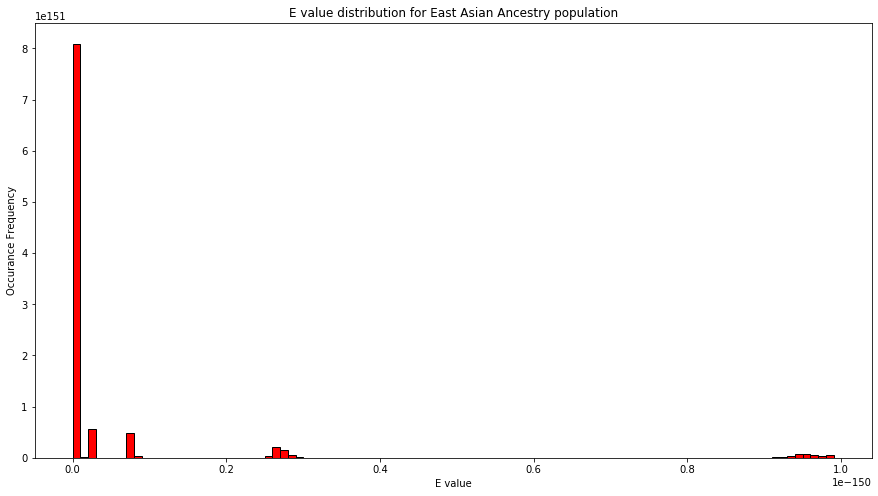

In [48]:
display_histogram("human/results_East_Asian_Ancestry.xml", "East Asian Ancestry")

The min e value is 0.0
The max e value is 2.21024e-08


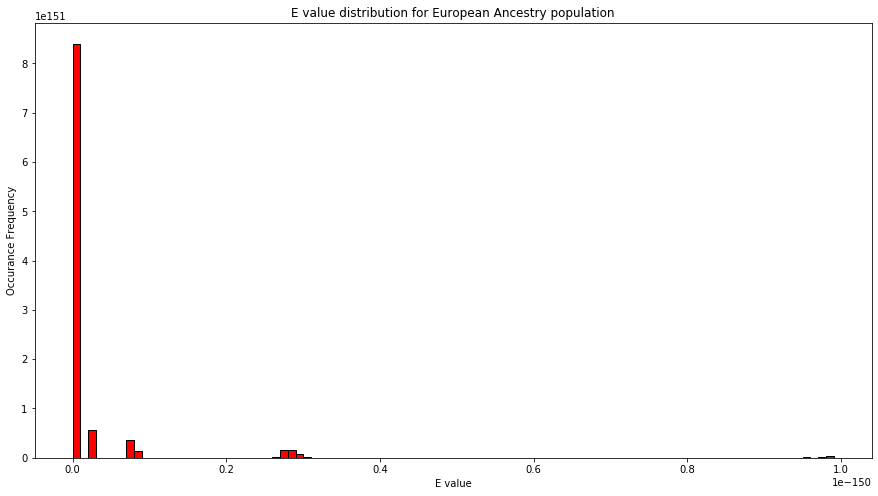

In [49]:
display_histogram("human/results_European_Ancestry.xml", "European Ancestry")

The min e value is 0.0
The max e value is 2.13438e-08


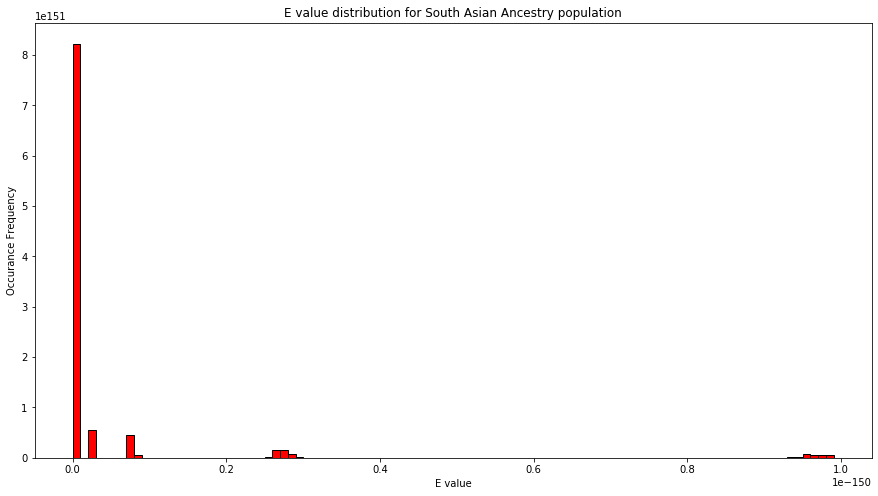

In [50]:
display_histogram("human/results_South_Asian_Ancestry.xml", "South Asian Ancestry")

The min e value is 0.0
The max e value is 1.15784e-08


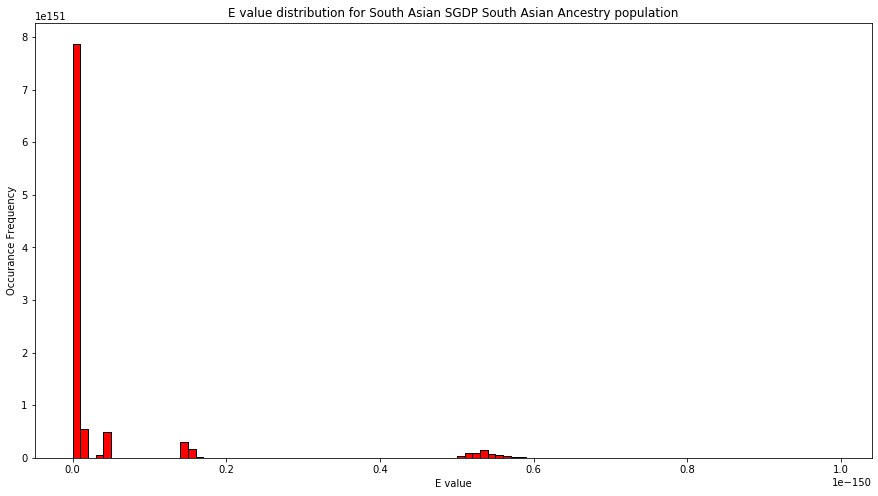

In [51]:
display_histogram("human/results_South_Asian_SGDP_South_Asian_Ancestry.xml", "South Asian SGDP South Asian Ancestry")

The min e value is 0.0
The max e value is 4.38191e-09


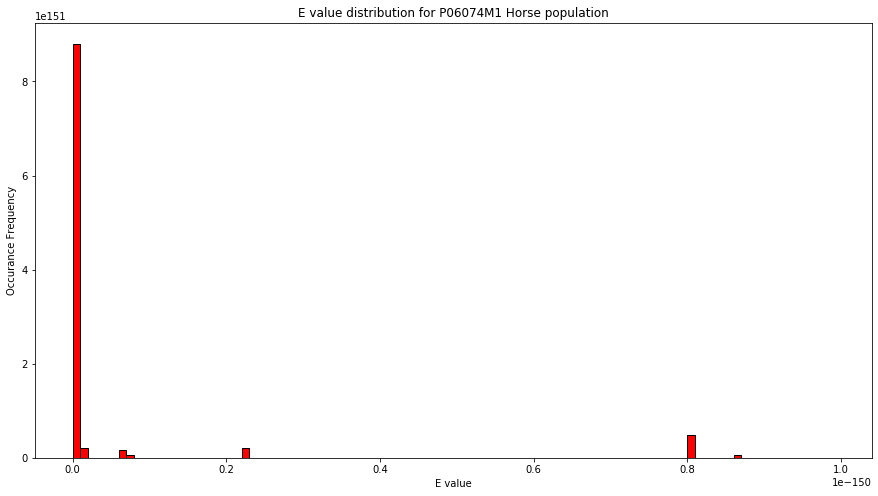

In [76]:
display_histogram("horse/result_P06074M1.xml", "P06074M1 Horse")

The min e value is 0.0
The max e value is 5.69854e-09


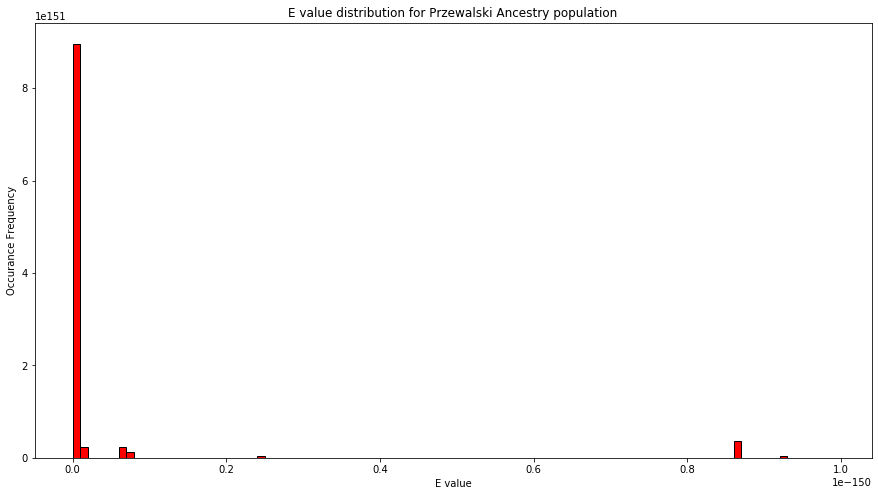

In [77]:
display_histogram("horse/results_Przewalski.xml", "Przewalski Ancestry")

The min e value is 0.0
The max e value is 3.65126e-11


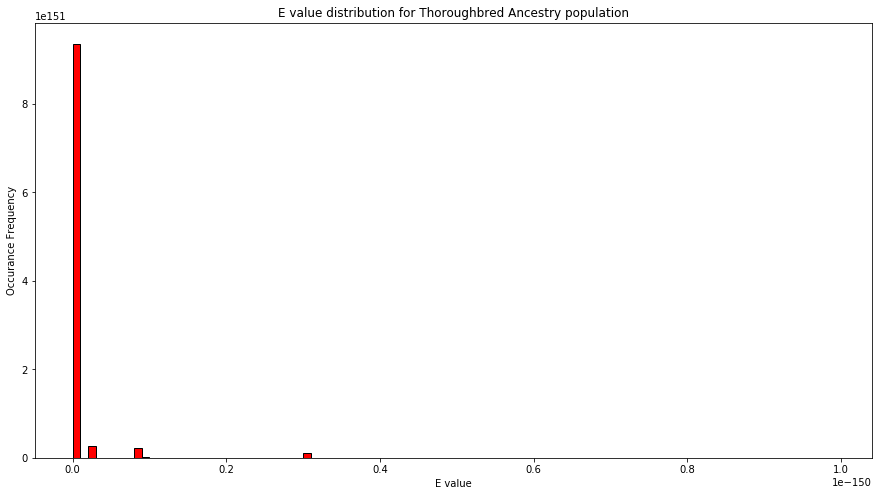

In [78]:
display_histogram("horse/results_thoroughbred.xml", "Thoroughbred Ancestry")